# This notebook plots the mean precipitation comparisons for a set of regions

In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import glob, os
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
from matplotlib.patches import Polygon
from itertools import chain
import colorcet as cc
import colormath, colormath.color_objects, colormath.color_conversions
from colormath.color_objects import sRGBColor
import urllib
import re
import copy
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
%matplotlib inline

In [2]:
# PHASE = 'Summer'
PHASE = 'Winter'

tracker = 'MOAAP'

if PHASE == 'Summer':
    track_period = '20160810_20160910'
    # datetime_range = pd.to_datetime(['2016-08-10T00', '2016-09-11T00'])
if PHASE == 'Winter':
    track_period = '20200201_20200301'
    # datetime_range = pd.to_datetime(['2020-02-01T00', '2020-03-01T00'])

rootdir = f'/pscratch/sd/f/feng045/DYAMOND/mcs_stats/{PHASE}/{tracker}/'
# rootdir = f'/pscratch/sd/f/feng045/DYAMOND/{PHASE}/'
# obsfile = f'{rootdir}OBS/stats/monthly/mcs_rainmap_{track_period}.nc'

if PHASE == 'Summer':
    name_map = {
        'obs': 'OBS',
        'm1': 'ARPEGE',
        'm2': 'IFS',
        'm3': 'MPAS',
        'm4': 'NICAM',
        'm5': 'SAM',
        'm6': 'UM',
        'm7': 'FV3',
        # 'm8': 'ICON',
    }
    obsfile = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["obs"]}.nc'
    m1file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m1"]}.nc'
    m2file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m2"]}.nc'
    m3file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m3"]}.nc'
    m4file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m4"]}.nc'
    m5file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m5"]}.nc'
    m6file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m6"]}.nc'
    m7file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m7"]}.nc'
    # m8file = f'{rootdir}{name_map["m8"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m9file = f'{rootdir}{name_map["m9"]}/stats/monthly/mcs_rainmap_{track_period}.nc'

if PHASE == 'Winter':
    name_map = {
        'obs': 'OBS',
        # 'm1': 'ARPEGE',
        'm2': 'IFS',
        'm3': 'MPAS',
        # 'm4': 'NICAM',
        'm5': 'SAM',
        'm6': 'UM',
        'm7': 'GRIST',
        'm8': 'SCREAM',
        'm9': 'XSHiELD',
        'm10': 'GEOS',
        'm11': 'ICON',
    }
    obsfile = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["obs"]}.nc'
    # m1file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m1"]}.nc'
    m2file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m2"]}.nc'
    m3file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m3"]}.nc'
    # m4file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m4"]}.nc'
    m5file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m5"]}.nc'
    m6file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m6"]}.nc'
    m7file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m7"]}.nc'
    m8file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m8"]}.nc'
    m9file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m9"]}.nc'
    m10file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m10"]}.nc'
    m11file = f'{rootdir}mcs_rainmap_{PHASE}_{name_map["m11"]}.nc'
    
    # m1file = f'{rootdir}{name_map["m1"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m2file = f'{rootdir}{name_map["m2"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m3file = f'{rootdir}{name_map["m3"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m4file = f'{rootdir}{name_map["m4"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m5file = f'{rootdir}{name_map["m5"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m6file = f'{rootdir}{name_map["m6"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m7file = f'{rootdir}{name_map["m7"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m8file = f'{rootdir}{name_map["m8"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m9file = f'{rootdir}{name_map["m9"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m10file = f'{rootdir}{name_map["m10"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    # m11file = f'{rootdir}{name_map["m11"]}/stats/monthly/mcs_rainmap_{track_period}.nc'
    
topfile = '/global/cfs/cdirs/m1867/zfeng/gpm/map_data/era5_orography.nc'

figdir = f'/global/cfs/cdirs/m1867/zfeng/MCSMIP/DYAMOND/{PHASE}/figures/{tracker}/'
os.makedirs(figdir, exist_ok=True)
print(figdir)

/global/cfs/cdirs/m1867/zfeng/MCSMIP/DYAMOND/Winter/figures/MOAAP/


In [4]:
# Check file existance
if PHASE == 'Winter':
    print(f'{obsfile}: {os.path.isfile(obsfile)}')
    # print(f'{m1file}: {os.path.isfile(m1file)}')
    print(f'{m2file}: {os.path.isfile(m2file)}')
    print(f'{m3file}: {os.path.isfile(m3file)}')
    # print(f'{m4file}: {os.path.isfile(m4file)}')
    print(f'{m5file}: {os.path.isfile(m5file)}')
    print(f'{m6file}: {os.path.isfile(m6file)}')
    print(f'{m7file}: {os.path.isfile(m7file)}')
    print(f'{m8file}: {os.path.isfile(m8file)}')
    print(f'{m9file}: {os.path.isfile(m9file)}')
    print(f'{m10file}: {os.path.isfile(m10file)}')
    print(f'{m11file}: {os.path.isfile(m11file)}')
    
if PHASE == 'Summer':
    print(f'{obsfile}: {os.path.isfile(obsfile)}')
    print(f'{m1file}: {os.path.isfile(m1file)}')
    print(f'{m2file}: {os.path.isfile(m2file)}')
    print(f'{m3file}: {os.path.isfile(m3file)}')
    print(f'{m4file}: {os.path.isfile(m4file)}')
    print(f'{m5file}: {os.path.isfile(m5file)}')
    print(f'{m6file}: {os.path.isfile(m6file)}')
    print(f'{m7file}: {os.path.isfile(m7file)}')
    # print(f'{m8file}: {os.path.isfile(m8file)}')
    # print(f'{m9file}: {os.path.isfile(m9file)}')

/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_OBS.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_IFS.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_MPAS.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_SAM.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_UM.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_GRIST.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_SCREAM.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_XSHiELD.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_GEOS.nc: True
/pscratch/sd/f/feng045/DYAMOND/mcs_stats/Winter/MOAAP/mcs_rainmap_Winter_ICON.nc: True


# These customed functions enables use of [NCL colormaps](https://www.ncl.ucar.edu/Document/Graphics/color_table_gallery.shtml)

In [5]:
color_obj_dict = {'sRGB':colormath.color_objects.sRGBColor,
                  'HSV':colormath.color_objects.HSVColor,
                  'Lab':colormath.color_objects.LabColor,
                  'LCHuv':colormath.color_objects.LCHuvColor,
                  'LCHab':colormath.color_objects.LCHabColor,
                  'XYZ':colormath.color_objects.XYZColor}

def __rgb_to_array(rgb_color):
    r = np.minimum(1, round(rgb_color.rgb_r*10000)/10000)
    g = np.minimum(1, round(rgb_color.rgb_g*10000)/10000)
    b = np.minimum(1, round(rgb_color.rgb_b*10000)/10000)
    return r,g,b


def create_palette(start_rgb, end_rgb, n, colorspace):
    # convert start and end to a point in the given colorspace
    start = colormath.color_conversions.convert_color(start_rgb, colorspace).get_value_tuple()
    end = colormath.color_conversions.convert_color(end_rgb, colorspace).get_value_tuple()

    # create a set of n points along start to end
    points = list(zip(*[np.linspace(start[i], end[i], n) for i in range(3)]))

    # create a color for each point and convert back to rgb
    rgb_colors = [colormath.color_conversions.convert_color(colorspace(*point), sRGBColor) for point in points]

    # finally convert rgb colors back to hex
    return [__rgb_to_array(color) for color in  rgb_colors]


def __retrive_NCL_webcontent(cmapname):
    target_url = 'https://www.ncl.ucar.edu/Document/Graphics/ColorTables/Files/%s.rgb' % cmapname
    request = urllib.request.urlopen(target_url)
    return request


def __collect_discrete_NCL_cmap(cmapname):
    rawdata = __retrive_NCL_webcontent(cmapname)
    
    cmap_color_list = list()
    
    color_section_sig = 0
    
    for line in rawdata:
        
        line_decode = line.decode('utf-8')
        info = re.split('\s+', line_decode.replace('\n','').replace('^\s+',''))

        if color_section_sig==1:
            if info[0]=='' and len(info)>=3:
                if np.maximum(np.maximum(float(info[1]), float(info[2])), float(info[3]))>1:
                    cmap_color_list.append((float(info[1])/255, float(info[2])/255, float(info[3])/255))
                else:
                    cmap_color_list.append((float(info[1]), float(info[2]), float(info[3])))
            if len(info)==3:
                if ';' in info[0] or '#' in info[0]:
                    whatisthis = 's'
                else:
                    if np.maximum(np.maximum(float(info[0]), float(info[1])), float(info[2]))>1:
                        cmap_color_list.append((float(info[0])/255, float(info[1])/255, float(info[2])/255))
                    else:
                        cmap_color_list.append((float(info[0]), float(info[1]), float(info[2])))
        
        if 'ncolors' in str(info[0]):
            color_section_sig = 1  # meaning now we are at color lines (or "r g b" line)

    return cmap_color_list


def __cmap_refinement(raw_cmap_rgb, n_interpolate=10, workspace=color_obj_dict['sRGB']):
    # workspace:  choose which color space the refinement is conducted.
    #             refer to https://stackoverflow.com/questions/55032648/given-a-start-color-and-a-middle-color-how-to-get-the-remaining-colors-python

    n_in = len(raw_cmap_rgb)

    new_array = list()

    for i in np.arange(n_in-1):
        out_colors = create_palette(sRGBColor(*raw_cmap_rgb[i], is_upscaled=False), sRGBColor(*raw_cmap_rgb[i+1], is_upscaled=False), n_interpolate+1, workspace)
        for j in np.arange(len(out_colors)-1):
            new_array.append(out_colors[j])

    return new_array


def generate_NCL_cmap(cmapname, cont_opt=False, cont_param_n=10, cont_param_ws='sRGB',
                      white_first=False, white_ext=False, reverse_cmap=False):
    # description:
    #     cmapname:      taken as shown on the NCL website
    #     cont_opt:      to convert the discreate colormap to continuous colormap
    #     cont_param_n:  how many "intermediate" colors to be inserted to the nearby discreate colors
    #     cont_param_ws: color space to conduct interploation. Default to "sRGB", which should work for most cases
    #     white_first:   whether to set the first color as white. May be useful if the minimum does not mean anything
    #     white_ext:     whether to add this above white as an extended color (when set to True), or just replace the first color (when set to False).
    #     reverse_cmap:  similar to "_r" in colormap.
    # note:  reverse_cmap is applied first, then white_first option.

    cmap_discrete_raw = __collect_discrete_NCL_cmap(cmapname)

    if reverse_cmap==True:
        cmap_discrete_raw.reverse()

    if white_first==True:
        if white_ext==True:
            cmap_discrete = list()
            cmap_discrete.append((1,1,1))
            for i in np.arange(len(cmap_discrete_raw)):
                cmap_discrete.append(cmap_discrete_raw[int(i)])
        else:
            cmap_discrete = cmap_discrete_raw.copy()
        cmap_discrete[0] = (1,1,1)
    else:
        cmap_discrete = cmap_discrete_raw

    if cont_opt==False:
        out_cmap = cmap_discrete

    if cont_opt==True:
        out_cmap = __cmap_refinement(cmap_discrete, n_interpolate=cont_param_n, workspace=color_obj_dict[cont_param_ws])

    return mpl.colors.ListedColormap(out_cmap)

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """ Truncate colormap.
    """
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

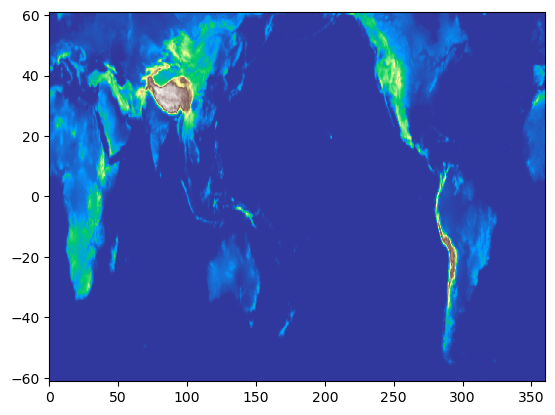

In [6]:
# Read topography data
dstop = xr.open_dataset(topfile)
# Convert surface geopotential to height in meters
ter = dstop.z.sel(latitude=slice(61,-61)).squeeze() / 9.80665
ter_s = gaussian_filter(ter, 1)
lon_ter = dstop.longitude
lat_ter = dstop.latitude.sel(latitude=slice(61,-61))
plt.pcolormesh(lon_ter, lat_ter, ter_s, cmap='terrain')

In [7]:
# Read OBS data
dsobs = xr.open_dataset(obsfile)

if PHASE == 'Winter':
    dsobs = dsobs.roll(lon=1800, roll_coords=True)
    # Convert longitude coordinates from -180~180 to 0~360
    lon360 = dsobs['lon'].data % 360
    dsobs = dsobs.assign_coords(lon=lon360)

lon_obs = dsobs['lon']
lat_obs = dsobs['lat']
dsobs

<xarray.Dataset>
Dimensions:                  (lat: 1200, lon: 3600, time: 1)
Coordinates:
  * time                     (time) datetime64[ns] 2020-02-01
  * lat                      (lat) float64 -59.95 -59.85 -59.75 ... 59.85 59.95
  * lon                      (lon) float64 0.05 0.15 0.25 ... 359.8 359.9 359.9
Data variables:
    longitude                (lat, lon) float32 0.05 0.15 0.25 ... -0.15 -0.05
    latitude                 (lat, lon) float32 -59.95 -59.95 ... 59.95 59.95
    precipitation            (time, lat, lon) float32 27.56 25.63 ... 139.8
    mcs_precipitation        (time, lat, lon) float32 5.634 5.681 ... 36.48
    mcs_precipitation_count  (time, lat, lon) float32 1.0 1.0 1.0 ... 14.0 14.0
    mcs_cloud_count          (time, lat, lon) float32 2.0 2.0 1.0 ... 40.0 40.0
    ntimes                   (time) float32 ...
Attributes:
    title:       MCS precipitation accumulation from MOAAP
    contact:     Zhe Feng, zhe.feng@pnnl.gov
    start_date:  20200201
    end_date:    20200301
    created_on:  Sat Oct 28 11:58:16 2023

In [8]:
if PHASE == 'Winter':
    # # Read m1 data
    # dsm1 = xr.open_dataset(m1file)
    # # Replace lat/lon with OBS to make sure they are identical for Xarray subtraction purpose
    # dsm1 = dsm1.roll(lon=1800, roll_coords=True)
    # dsm1 = dsm1.assign_coords(lon=lon_obs)
    # dsm1 = dsm1.assign_coords(lat=lat_obs)
    
    # Read m2 data
    dsm2 = xr.open_dataset(m2file)
    dsm2 = dsm2.roll(lon=1800, roll_coords=True)
    dsm2 = dsm2.assign_coords(lon=lon_obs)
    dsm2 = dsm2.assign_coords(lat=lat_obs)

    # Read m3 data
    dsm3 = xr.open_dataset(m3file)
    dsm3 = dsm3.roll(lon=1800, roll_coords=True)
    dsm3 = dsm3.assign_coords(lon=lon_obs)
    dsm3 = dsm3.assign_coords(lat=lat_obs)

    # # Read m4 data
    # dsm4 = xr.open_dataset(m4file)
    # dsm4 = dsm4.roll(lon=1800, roll_coords=True)
    # dsm4 = dsm4.assign_coords(lon=lon_obs)
    # dsm4 = dsm4.assign_coords(lat=lat_obs)

    # Read m5 data
    dsm5 = xr.open_dataset(m5file)
    dsm5 = dsm5.roll(lon=1800, roll_coords=True)
    dsm5 = dsm5.assign_coords(lon=lon_obs)
    dsm5 = dsm5.assign_coords(lat=lat_obs)

    # Read m6 data
    dsm6 = xr.open_dataset(m6file)
    dsm6 = dsm6.roll(lon=1800, roll_coords=True)
    dsm6 = dsm6.assign_coords(lon=lon_obs)
    dsm6 = dsm6.assign_coords(lat=lat_obs)
    
    # Read m7 data
    dsm7 = xr.open_dataset(m7file)
    dsm7 = dsm7.roll(lon=1800, roll_coords=True)
    dsm7 = dsm7.assign_coords(lon=lon_obs)
    dsm7 = dsm7.assign_coords(lat=lat_obs)
    
    # Read m8 data
    dsm8 = xr.open_dataset(m8file)
    dsm8 = dsm8.roll(lon=1800, roll_coords=True)
    dsm8 = dsm8.assign_coords(lon=lon_obs)
    dsm8 = dsm8.assign_coords(lat=lat_obs)
    
    # Read m9 data
    dsm9 = xr.open_dataset(m9file)
    dsm9 = dsm9.roll(lon=1800, roll_coords=True)
    dsm9 = dsm9.assign_coords(lon=lon_obs)
    dsm9 = dsm9.assign_coords(lat=lat_obs)
    
    # Read m10 data
    dsm10 = xr.open_dataset(m10file)
    dsm10 = dsm10.roll(lon=1800, roll_coords=True)
    dsm10 = dsm10.assign_coords(lon=lon_obs)
    dsm10 = dsm10.assign_coords(lat=lat_obs)
    
    # Read m11 data
    dsm11 = xr.open_dataset(m11file)
    dsm11 = dsm11.roll(lon=1800, roll_coords=True)
    dsm11 = dsm11.assign_coords(lon=lon_obs)
    dsm11 = dsm11.assign_coords(lat=lat_obs)

In [9]:
if PHASE == 'Summer':
    # Read m1 data
    dsm1 = xr.open_dataset(m1file)
    # Replace lat/lon with OBS to make sure they are identical for Xarray subtraction purpose
    dsm1 = dsm1.assign_coords(lon=lon_obs)
    dsm1 = dsm1.assign_coords(lat=lat_obs)
    
    # Read m2 data
    dsm2 = xr.open_dataset(m2file)
    dsm2 = dsm2.assign_coords(lon=lon_obs)
    dsm2 = dsm2.assign_coords(lat=lat_obs)

    # Read m3 data
    dsm3 = xr.open_dataset(m3file)
    dsm3 = dsm3.assign_coords(lon=lon_obs)
    dsm3 = dsm3.assign_coords(lat=lat_obs)

    # Read m4 data
    dsm4 = xr.open_dataset(m4file)
    dsm4 = dsm4.assign_coords(lon=lon_obs)
    dsm4 = dsm4.assign_coords(lat=lat_obs)

    # Read m5 data
    dsm5 = xr.open_dataset(m5file)
    dsm5 = dsm5.assign_coords(lon=lon_obs)
    dsm5 = dsm5.assign_coords(lat=lat_obs)

    # Read m6 data
    dsm6 = xr.open_dataset(m6file)
    dsm6 = dsm6.assign_coords(lon=lon_obs)
    dsm6 = dsm6.assign_coords(lat=lat_obs)
    
    # Read m7 data
    dsm7 = xr.open_dataset(m7file)
    dsm7 = dsm7.assign_coords(lon=lon_obs)
    dsm7 = dsm7.assign_coords(lat=lat_obs)
    
#     # Read m8 data
#     dsm8 = xr.open_dataset(m8file)
#     dsm8 = dsm8.assign_coords(lon=lon_obs)
#     dsm8 = dsm8.assign_coords(lat=lat_obs)
    
#     # Read m9 data
#     dsm9 = xr.open_dataset(m9file)
#     dsm9 = dsm9.assign_coords(lon=lon_obs)
#     dsm9 = dsm9.assign_coords(lat=lat_obs)

In [10]:
if PHASE == 'Summer':
    ds_list = [dsobs, dsm1, dsm2, dsm3, dsm4, dsm5, dsm6, dsm7]
if PHASE == 'Winter':
    ds_list = [dsobs, dsm2, dsm3, dsm5, dsm6, dsm7, dsm8, dsm9, dsm10, dsm11]
    # ds_list = [dsobs, dsm1, dsm2, dsm3, dsm4, dsm5, dsm6, dsm7, dsm8, dsm9, dsm10, dsm11]

# Combine all datasets
ds = xr.concat(ds_list, dim='source').squeeze()
# Assign new coordinate 'source' using names
ds['source'] = list(name_map.keys())
lon = ds['lon']
lat = ds['lat']
ds

<xarray.Dataset>
Dimensions:                  (source: 10, lat: 1200, lon: 3600)
Coordinates:
    time                     datetime64[ns] 2020-02-01
  * lat                      (lat) float64 -59.95 -59.85 -59.75 ... 59.85 59.95
  * lon                      (lon) float64 0.05 0.15 0.25 ... 359.8 359.9 359.9
  * source                   (source) <U3 'obs' 'm2' 'm3' ... 'm9' 'm10' 'm11'
Data variables:
    longitude                (source, lat, lon) float32 0.05 0.15 ... -0.05
    latitude                 (source, lat, lon) float32 -59.95 -59.95 ... 59.95
    precipitation            (source, lat, lon) float32 27.56 25.63 ... 89.24
    mcs_precipitation        (source, lat, lon) float32 5.634 5.681 ... 0.0 0.0
    mcs_precipitation_count  (source, lat, lon) float32 1.0 1.0 1.0 ... 0.0 0.0
    mcs_cloud_count          (source, lat, lon) float32 2.0 2.0 1.0 ... 0.0 0.0
    ntimes                   (source) float32 672.0 672.0 672.0 ... 696.0 672.0
Attributes:
    title:       MCS precipitation accumulation from MOAAP
    contact:     Zhe Feng, zhe.feng@pnnl.gov
    start_date:  20200201
    end_date:    20200301
    created_on:  Sat Oct 28 11:58:16 2023

In [11]:
# Total number of hours
nhours = ds.ntimes
print(f'Number of total hours: {nhours.data}')
# Precipitation amount [mm], divided by total number of hours to get [mm/h]
# then x24 to get [mm/day]
totpcp = 24. * ds.precipitation / nhours
mcspcp = 24. * ds.mcs_precipitation / nhours
nonmcspcp = totpcp - mcspcp
# MCS precipitation fraction
mcspcpfrac = 100 * mcspcp / totpcp

# Number of hours with MCS precipitation/cloud
mcspcphours = ds.mcs_precipitation_count
mcscloudhours = ds.mcs_cloud_count
# MCS precipitation mean intensity (conditional mean)
mcspcpmeanintensity = ds.mcs_precipitation / mcspcphours

# MCS precipitation frequency
mcspcpfreq = 100 * (mcspcphours / nhours)
mcscloudfreq = 100 * (mcscloudhours / nhours)

Number of total hours: [672. 672. 672. 672. 672. 672. 672. 673. 696. 672.]


In [12]:
def get_obs_model_diff(da):
    """
    Get obs, models & calculate their differences
    
    Args:
        da: DataArray
            DataArray containing multiple sources (including 'obs' & models)
            
    Returns:
        da_obs: DataArray
            DataArray containing observation
        da_mod: DataArray
            DataArray containing models
        da_diff: DataArray
            DataArray containing differences    
    """
    # Select non-obs sources (models) & obs
    da_mod = da.isel(source=ds['source'] != 'obs')
    da_obs = da.sel(source='obs')
    # Compute the difference (model - obs)
    da_diff = da_mod - da_obs
    return (da_obs, da_mod, da_diff)

In [13]:
# Get obs, models, & differences
totpcp_obs, totpcp_mod, totpcp_diff = get_obs_model_diff(totpcp)
mcspcp_obs, mcspcp_mod, mcspcp_diff = get_obs_model_diff(mcspcp)
mcspcpmeanintensity_obs, mcspcpmeanintensity_mod, mcspcpmeanintensity_diff = get_obs_model_diff(mcspcpmeanintensity)
mcspcpfrac_obs, mcspcpfrac_mod, mcspcpfrac_diff = get_obs_model_diff(mcspcpfrac)

# MCS precipitation / cloud frequency
mcspcpfreq_obs, mcspcpfreq_mod, mcspcpfreq_diff = get_obs_model_diff(mcspcpfreq)
mcscloudfreq_obs, mcscloudfreq_mod, mcscloudfreq_diff = get_obs_model_diff(mcscloudfreq)

# MCS precipitation / cloud hours
mcspcphours_obs, mcspcphours_mod, mcspcphours_diff = get_obs_model_diff(mcspcphours)
mcscloudhours_obs, mcscloudhours_mod, mcscloudhours_diff = get_obs_model_diff(mcscloudhours)

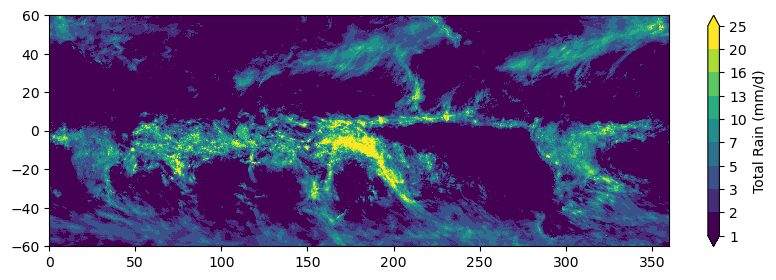

In [14]:
fig = plt.figure(figsize=[10,3], dpi=100)
# levels = np.arange(0,25.1,1)
levels = [1,2,3,5,7,10,13,16,20,25]
cmap = copy.copy(mpl.colormaps.get_cmap("viridis"))
# cmap = generate_NCL_cmap('precip3_16lev', cont_param_ws='sRGB')
norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=256)
pcm = plt.pcolormesh(lon, lat, totpcp_obs, norm=norm, cmap=cmap)
plt.colorbar(label='Total Rain (mm/d)', extend='both')
# pcm.cmap.set_over('magenta')
# pcm.cmap.set_under('white')

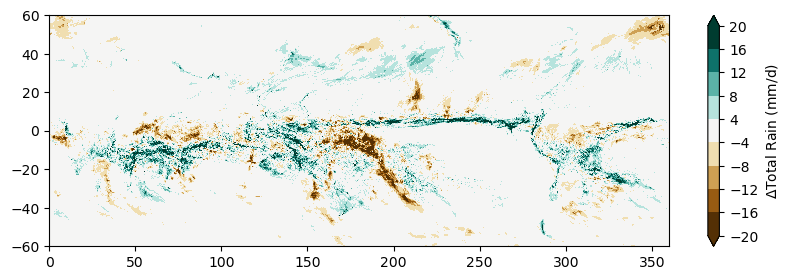

In [16]:
fig = plt.figure(figsize=[10,3], dpi=100)
levels = [-20,-16,-12,-8,-4,4,8,12,16,20]
cmap = mpl.colormaps.get_cmap('BrBG')
norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)
pcm = plt.pcolormesh(lon, lat, totpcp_diff.sel(source='m2'), norm=norm, cmap=cmap)
plt.colorbar(label='$\Delta$Total Rain (mm/d)', extend='both')

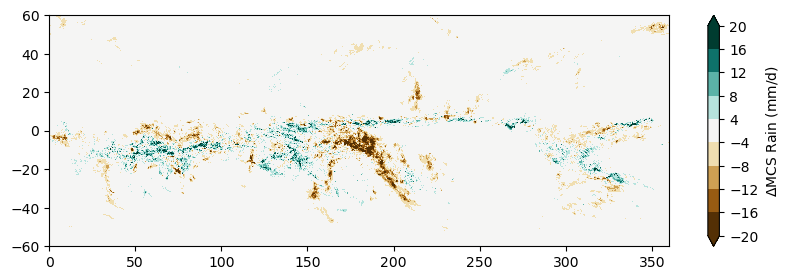

In [17]:
fig = plt.figure(figsize=[10,3], dpi=100)
levels = [-20,-16,-12,-8,-4,4,8,12,16,20]
cmap = mpl.colormaps.get_cmap('BrBG')
norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)
pcm = plt.pcolormesh(lon, lat, mcspcp_diff.sel(source='m2'), norm=norm, cmap=cmap)
plt.colorbar(label='$\Delta$MCS Rain (mm/d)', extend='both')

In [18]:
# fig = plt.figure(figsize=[10,3], dpi=100)
# levels = [-20,-16,-12,-8,-4,4,8,12,16,20]
# cmap = mpl.colormaps.get_cmap('BrBG')
# norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)
# pcm = plt.pcolormesh(lon, lat, mcspcp_diff.sel(source='m2'), norm=norm, cmap=cmap)
# plt.colorbar(label='$\Delta$MCS Rain (mm/d)', extend='both')

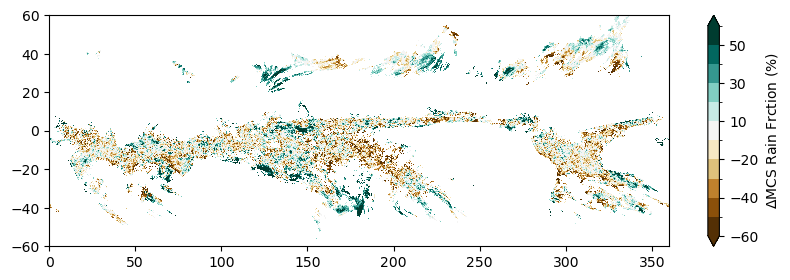

In [19]:
fig = plt.figure(figsize=[10,3], dpi=100)
levels = np.arange(-60, 60.1, 10)
levels = np.delete(levels, int((len(levels)-1)/2))
cmap = mpl.colormaps.get_cmap('BrBG')
norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)
pcm = plt.pcolormesh(lon, lat, mcspcpfrac_diff.where(mcspcp_mod > 1).sel(source='m2'), norm=norm, cmap=cmap)
plt.colorbar(label='$\Delta$MCS Rain Frction (%)', extend='both')

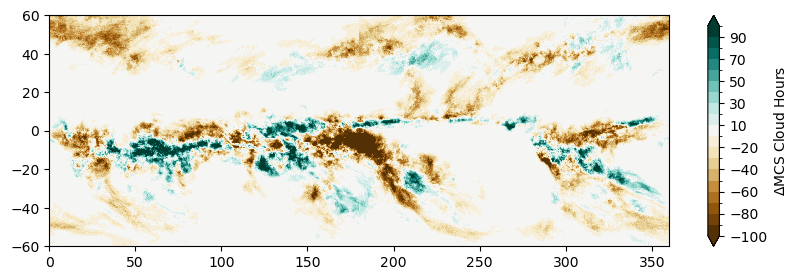

In [20]:
fig = plt.figure(figsize=[10,3], dpi=100)
levels = np.arange(-100, 100.1, 10)
levels = np.delete(levels, int((len(levels)-1)/2))
cmap = mpl.colormaps.get_cmap('BrBG')
norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)
pcm = plt.pcolormesh(lon, lat, mcscloudhours_diff.sel(source='m2'), norm=norm, cmap=cmap)
plt.colorbar(label='$\Delta$MCS Cloud Hours', extend='both')

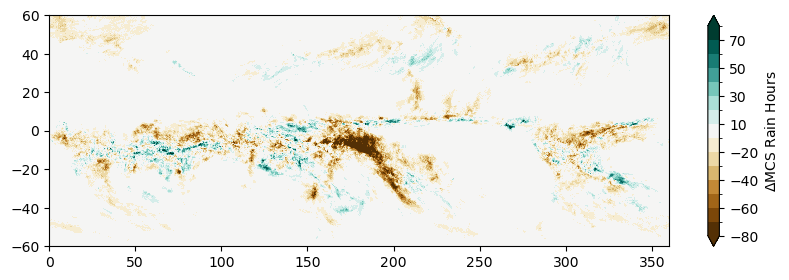

In [21]:
fig = plt.figure(figsize=[10,3], dpi=100)
levels = np.arange(-80, 80.1, 10)
levels = np.delete(levels, int((len(levels)-1)/2))
cmap = mpl.colormaps.get_cmap('BrBG')
norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)
pcm = plt.pcolormesh(lon, lat, mcspcphours_diff.sel(source='m2'), norm=norm, cmap=cmap)
plt.colorbar(label='$\Delta$MCS Rain Hours', extend='both')

## Specify regional boundaries for calculating mean values

In [22]:
if PHASE == 'Winter':
    box_mc = [95%360,150%360,-20,5]
    box_itcz = [151%360,-110%360,0,12]
    box_spcz = [151%360,-150%360,-30,-1]
    box_io = [50%360,94%360,-15,5]
    box_afc = [10%360,40%360,-20,5]
    box_amz = [-75%360,-40%360,-20,0]
    box_ao = [-40%360,-10%360,-8,8]
    boxes = {'MC':box_mc, 
             'ITCZ':box_itcz, 
             'SPCZ':box_spcz, 
             'IO':box_io, 
             'AO':box_ao,
             'AFC':box_afc, 
             'AMZ':box_amz, 
             }
    region_names = dict(zip(boxes.keys(), boxes.keys()))
    
    # Calculate regional mean difference
    diff_reg = np.zeros(len(boxes), dtype=float)
    text_loc_x = np.zeros(len(boxes), dtype=float)
    for ii, name in enumerate(boxes):
        text_loc_x[ii] = boxes[name][0] + (boxes[name][1] - boxes[name][0])/2.
    text_loc_y = [
        boxes['MC'][3]+3,
        boxes['ITCZ'][3]+3,
        boxes['SPCZ'][2]-8, 
        boxes['IO'][2]-8, 
        boxes['AO'][3]+3,
        boxes['AFC'][2]-8, 
        boxes['AMZ'][2]-8, 
    ]
    text_loc = dict(zip(boxes.keys(), zip(text_loc_x, text_loc_y)))
    text_loc['SPCZ'] = text_loc['SPCZ'][0] + 20, text_loc['SPCZ'][1]

In [23]:
if PHASE == 'Summer':
    box_mc = [95,150,-20,5]
    box_itcz = [-179,-70,5,18]
    box_io = [50,94,-15,5]
    box_wpac = [125,178,0,30]
    box_sam = [70,125,5,40]
    box_afc = [-15,40,-5,18]
    box_amz = [-75,-40,-20,0]
    box_ao = [-60,-15,5,18]
    box_cus = [-105, -80, 30, 50]
    box_ao180 = [-60,-15,5,18]
    box_cus180 = [-105, -80, 30, 50]
    boxes = {
        'WP':box_wpac,
        'ITCZ':box_itcz, 
        'IO':box_io, 
        'AO':box_ao,
        'AFC':box_afc, 
        'SAM':box_sam,
        'CUS':box_cus,
    }
    region_names = dict(zip(boxes.keys(), boxes.keys()))
    
    # Calculate regional mean difference
    diff_reg = np.zeros(len(boxes), dtype=float)
    text_loc_x = np.zeros(len(boxes), dtype=float)
    for ii, name in enumerate(boxes):
        text_loc_x[ii] = boxes[name][0] + (boxes[name][1] - boxes[name][0])/2.
    text_loc_y = [
        boxes['WP'][3]+3,
        boxes['ITCZ'][3]+3, 
        boxes['IO'][2]-8, 
        boxes['AO'][3]+3,
        boxes['AFC'][2]-8, 
        boxes['SAM'][3]+3,
        boxes['CUS'][3]+3,
    ]
    text_loc = dict(zip(boxes.keys(), zip(text_loc_x, text_loc_y)))

In [24]:
text_loc

{'MC': (122.5, 8),
 'ITCZ': (200.5, 15),
 'SPCZ': (200.5, -38),
 'IO': (72.0, -23),
 'AO': (335.0, 11),
 'AFC': (25.0, -28),
 'AMZ': (302.5, -28)}

In [25]:
# # name = 'WP'
# name = 'ITCZ'
# # Select (subset) the region
# itotpcp = totpcp.sel(lon=slice(boxes[name][0], boxes[name][1]), lat=slice(boxes[name][2], boxes[name][3]), drop=True)
# itotpcp_obs = totpcp.sel(source='obs', lon=slice(boxes[name][0], boxes[name][1]), lat=slice(boxes[name][2], boxes[name][3]), drop=True)

# # Select non-obs sources, sum over the region
# itotpcp_mod = itotpcp.isel(source=itotpcp['source'] != 'obs').sum(dim=('lat','lon'))
# itotpcp_obs = itotpcp.sel(source='obs').sum(dim=('lat','lon'))

# # Calculate fractional difference
# diff_reg = 100 * (itotpcp_mod - itotpcp_obs) / itotpcp_obs
# diff_reg

# # idiff = itotpcp.sum(dim=('lat','lon')).diff(dim='source')
# # iobs = itotpcp.sel(source='obs').sum(dim=('lat','lon'))
# # idiff = itotpcp.sum(dim=('lat','lon')) - iobs
# # diff_reg = 100 * (idiff / iobs)

# # print((itotpcp.sum(dim=('lat','lon')) - iobs).data)
# # print(idiff.data)
# # diff_reg.sel(source='m4')

## Function to calculate regional mean percentage difference

In [26]:
def calc_regional_diff_percent(da, boxes):
    """
    Calculate regional mean percentage difference
    Args:
        da: DataArray
            Data Array containing dimensions (source, lat, lon)
        boxes: dictionary
            Dictionary containing region names and lat/lon bounds
        
    Returns:
        dict_out: dictionary
            Dictionary containing mean difference for each box.
    """
    # Get number of sources (-1)
    nsource = da.sizes['source']-1
    # Get number of boxes
    nbox = len(boxes)
    # Get source names (exclude first one 'obs')
    source_names = list(da.source.data[1:])
    
    # Make arrays to store the differences
    diff_reg = np.zeros((nsource,nbox), dtype=float)
    text_loc_x = np.zeros((nsource,nbox), dtype=float)
    
    # Loop over each region
    for ii, name in enumerate(boxes):
        text_loc_x[ii] = boxes[name][0] + (boxes[name][1] - boxes[name][0])/2.
        
        # Select (subset) the region
        ida = da.sel(lon=slice(boxes[name][0], boxes[name][1]), lat=slice(boxes[name][2], boxes[name][3]), drop=True)        
        # Select non-obs sources, sum over the region
        ida_mod = ida.isel(source=ida['source'] != 'obs').sum(dim=('lat','lon'))
        # Select obs, sum over the region
        ida_obs = ida.sel(source='obs').sum(dim=('lat','lon'))

        # Calculate fractional difference
        diff_reg[:,ii] = 100 * (ida_mod - ida_obs) / ida_obs
        
    # Put values in dictionary
    dict_out = dict(zip(source_names, diff_reg))
    # print(dict_out)
    
    return dict_out

In [27]:
dict_totpcp = calc_regional_diff_percent(totpcp, boxes)
dict_totpcp

{'m2': array([ 44.90927505,  27.74512482, -27.6819191 ,  10.34092903,
          0.23700677,  20.27611351,  20.99047852]),
 'm3': array([-19.90066338,  -0.36155125,  -3.32888317, -54.83774185,
        -77.77935791, -64.44348145, -56.516819  ]),
 'm5': array([ 25.39863205,  41.9924736 , -38.72811127,  64.245224  ,
         12.92747593,   5.4399538 ,  29.78038979]),
 'm6': array([ 72.42733765,  11.85174751, -10.48066235,   1.94499576,
          5.2157135 ,  12.50776005,  43.33614731]),
 'm7': array([ 56.6617775 ,  58.98208618, -14.60841751,  11.25840569,
        -37.47631073, -20.20093536,  -0.52517033]),
 'm8': array([ 60.61915207,  36.37511063, -21.33223152, -21.30196953,
         16.11477661,  -3.89094186,   0.87069541]),
 'm9': array([ 36.88832092,  22.23216438,  -8.70188522,  -8.17171383,
        -17.24016953, -22.11255836,   0.27058285]),
 'm10': array([ 54.2067337 ,  24.6299572 , -48.24929428, -15.41537857,
          1.47188818,  45.98441315,  28.12818718]),
 'm11': array([ 15.8848

In [28]:
dict_mcspcp = calc_regional_diff_percent(mcspcp, boxes)
dict_mcspcp

{'m2': array([ 28.42725945,  -8.05097961, -62.70295334,  -0.94559073,
        -31.31135559,  -7.81695795,   0.95108968]),
 'm3': array([-44.75474167, -10.64346981, -21.9219799 , -70.16822815,
        -96.13864899, -76.64684296, -73.16876221]),
 'm5': array([-23.53713799, -27.84617615, -77.99196625,  18.00456238,
        -58.07509613, -55.02461243, -34.75802994]),
 'm6': array([ 86.36919403, -25.46405983, -30.85389519,  -0.51205701,
        -46.22052383, -21.19805145,  25.10295296]),
 'm7': array([ -29.02390862,  -54.8924408 ,  -75.98387146,  -45.01553345,
        -100.        ,  -81.13812256,  -90.59078217]),
 'm8': array([  6.79269123, -61.8677597 , -80.013237  , -62.37324524,
        -91.16330719, -65.05393982, -64.4588623 ]),
 'm9': array([ 31.56197739, -14.02562141, -34.78844833, -21.35845566,
        -65.39464569, -52.1680336 , -22.57788849]),
 'm10': array([ 47.14373016, -13.51794434, -73.90539551, -53.73750687,
        -44.63111877,   4.7719388 ,  -7.07284403]),
 'm11': array([ 

In [29]:
dict_mcscloudfreq = calc_regional_diff_percent(mcscloudhours, boxes)
dict_mcscloudfreq

{'m2': array([ 14.61979485, -19.33615875, -56.80291367,  15.0681057 ,
        -42.3829422 , -31.17726326, -12.20860004]),
 'm3': array([-25.19003487,  38.55037689,  28.22814941, -42.27225494,
        -89.51522064, -64.26126862, -48.3952713 ]),
 'm5': array([  4.83365202, -15.06597137, -64.07384491,  95.84093475,
        -33.42066574, -47.92142105, -28.04294014]),
 'm6': array([ 43.08121109, -32.62464905, -34.08744049,  -9.41307735,
        -66.01222992, -51.00880814, -18.28062057]),
 'm7': array([ -48.34503555,  -56.58320618,  -71.45374298,  -38.31867218,
        -100.        ,  -88.57568359,  -94.09080505]),
 'm8': array([ -4.82449913, -56.68716431, -80.52465057, -39.27140045,
        -90.15164185, -76.39254761, -74.01688385]),
 'm9': array([111.12110901,  39.74132919,   5.27316284,  54.5893364 ,
        -25.99999428, -42.12203217,  -7.85205984]),
 'm10': array([ 67.53925323, -14.80667305, -66.68466949, -41.43926239,
        -45.06137085,   7.98865938,   7.41434479]),
 'm11': array([1

In [30]:
dict_mcspcpfreq = calc_regional_diff_percent(mcspcphours, boxes)
dict_mcspcpfreq

{'m2': array([-13.90374374, -33.40361404, -71.5840683 , -24.1931324 ,
        -57.10643005, -32.89263153, -35.60490417]),
 'm3': array([-66.70752716, -34.38607407, -43.20505905, -78.66930389,
        -97.22212982, -83.39601135, -80.68591309]),
 'm5': array([-58.63010406, -53.64519882, -85.55120087, -24.10423088,
        -72.17588806, -71.69495392, -64.49617004]),
 'm6': array([ 20.13844872, -42.77354431, -47.91154861, -16.29818535,
        -69.70384216, -59.22753525, -37.05038452]),
 'm7': array([ -61.03783798,  -67.31723785,  -82.44617462,  -63.02562332,
        -100.        ,  -88.98747253,  -95.05934143]),
 'm8': array([-35.9411087 , -71.42814636, -86.97027588, -69.62548828,
        -93.69658661, -82.1259079 , -81.58760071]),
 'm9': array([-12.13390064, -35.17343521, -48.90354919, -35.18811417,
        -75.04649353, -71.30851746, -55.59994507]),
 'm10': array([ -0.75577003, -35.98368835, -77.03553009, -65.34945679,
        -68.61784363, -31.08923912, -44.6442337 ]),
 'm11': array([-

## Function to calculate regional fractionl difference between two sources

In [31]:
def calc_regional_diff_frac(da1, da2, boxes):
    """
    Calculate regional fractional difference between two sources
    fraction = da1 / da2
    
    Args:
        da1: DataArray
            Data Array 1 containing dimensions (source, lat, lon)
        da2: DataArray
            Data Array 2 containing dimensions (source, lat, lon)
        boxes: dictionary
            Dictionary containing region names and lat/lon bounds
        
    Returns:
        dict_out: dictionary
            Dictionary containing mean difference for each box.
    """
    # Get number of sources (-1)
    nsource = da1.sizes['source']-1
    # Get number of boxes
    nbox = len(boxes)
    # Get source names (exclude first one 'obs')
    source_names = list(da1.source.data[1:])
    
    # Make arrays to store the differences
    diff_reg = np.zeros((nsource,nbox), dtype=float)
    text_loc_x = np.zeros((nsource,nbox), dtype=float)
    
    # Loop over each region
    for ii, name in enumerate(boxes):
        text_loc_x[ii] = boxes[name][0] + (boxes[name][1] - boxes[name][0])/2.
        
        # Select (subset) the region
        ida1 = da1.sel(lon=slice(boxes[name][0], boxes[name][1]), lat=slice(boxes[name][2], boxes[name][3]), drop=True)
        ida2 = da2.sel(lon=slice(boxes[name][0], boxes[name][1]), lat=slice(boxes[name][2], boxes[name][3]), drop=True)     
        # Select non-obs sources, sum over the region
        ida1_mod = ida1.isel(source=ida1['source'] != 'obs').sum(dim=('lat','lon'))
        ida2_mod = ida2.isel(source=ida2['source'] != 'obs').sum(dim=('lat','lon'))
        # Select obs, sum over the region
        ida1_obs = ida1.sel(source='obs').sum(dim=('lat','lon'))
        ida2_obs = ida2.sel(source='obs').sum(dim=('lat','lon'))
        
        # Calculate mean fraction
        idafrac_obs = 100 * (ida1_obs) / (ida2_obs)
        idafrac_mod = 100 * (ida1_mod) / (ida2_mod)

        # Calculate difference
        diff_reg[:,ii] = (idafrac_mod - idafrac_obs)
        
    # Put values in dictionary
    dict_out = dict(zip(source_names, diff_reg))
    # print(dict_out)
    
    return dict_out

In [32]:
dict_mcspcpfrac = calc_regional_diff_frac(mcspcp, totpcp, boxes)
dict_mcspcpfrac

{'m2': array([ -6.67901779, -15.25413269, -31.8569825 ,  -6.61004257,
        -19.79843188, -13.505311  , -10.12399974]),
 'm3': array([-18.22079254,  -5.61750168, -12.6525338 , -21.93617248,
        -51.97342731, -19.84473513, -23.40789714]),
 'm5': array([-22.91564346, -26.77481789, -42.15550355, -18.19331741,
        -39.55092097, -33.15741061, -30.39681545]),
 'm6': array([  4.74802613, -18.1612677 , -14.97150734,  -1.55750656,
        -30.75181628, -17.32236193,  -7.77545848]),
 'm7': array([-32.11764503, -38.99190182, -47.28268746, -32.68550109,
        -62.90456058, -44.15393542, -55.34324565]),
 'm8': array([-19.67872406, -39.21587796, -49.07081536, -33.72523307,
        -58.11732818, -36.79673861, -39.58800045]),
 'm9': array([ -2.28486801, -16.14774079, -18.79652337,  -9.27986526,
        -36.60152865, -22.3121271 , -13.92843929]),
 'm10': array([ -2.6895845 , -16.66265625, -32.61346367, -29.27783203,
        -28.58022739, -16.32326602, -16.79304805]),
 'm11': array([ -1.7577

In [33]:
list(region_names.keys())

['MC', 'ITCZ', 'SPCZ', 'IO', 'AO', 'AFC', 'AMZ']

In [34]:
name_map

{'obs': 'OBS',
 'm2': 'IFS',
 'm3': 'MPAS',
 'm5': 'SAM',
 'm6': 'UM',
 'm7': 'GRIST',
 'm8': 'SCREAM',
 'm9': 'XSHiELD',
 'm10': 'GEOS',
 'm11': 'ICON'}

## Plot regional mean difference as bar chart

In [35]:
def bar_chart(dict_data, region_names, name_map, width=None, ylabel=None, ylim=None, legend_prop=None, figsize=None, figname=None):

    mpl.rcParams['font.size'] = 16
    mpl.rcParams['font.family'] = 'Helvetica'
    mpl.rcParams['font.weight'] = 'regular'
    fig, ax = plt.subplots(figsize=figsize, dpi=100)

    labels = list(region_names.keys())
    x = np.arange(len(labels))
    multiplier = -((len(name_map)-1)/2)
    lcolors = {
        'obs':'k', 
        'm1': 'crimson',
        'm2': 'darkorange', 
        'm3': 'gold',
        'm4': 'green',
        'm5': 'turquoise',
        'm6': 'lime',
        'm7': 'blue',
        'm8': 'deepskyblue',
        'm9': 'purple',
        'm10': 'violet',
        'm11': 'deeppink',
    }

    # Loop over each source    
    for key, val in dict_data.items():
        offset = width * multiplier
        rects = ax.bar(x + offset, val, width, color=lcolors[key], label=name_map[key])
        multiplier += 1    

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel(ylabel)
    # ax.set_title('', loc='left')
    ax.set_xticks(x, labels)
    ax.legend(ncol=legend_prop['ncol'], fontsize=legend_prop['fontsize'])
    ax.axhline(y=0, lw=1, ls='--', color='k')
    ax.grid(which='major', ls='--', axis='y')
    ax.set_ylim(ylim[0], ylim[1])

    fig.tight_layout()
    # fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w')
    return fig

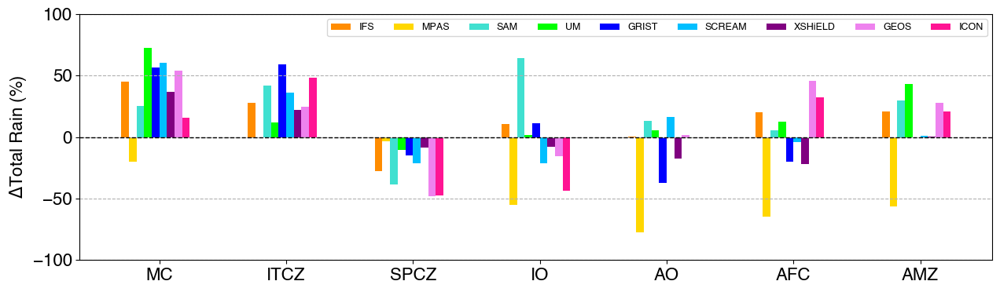

In [36]:
ylabel = f'$\Delta$Total Rain (%)'
if PHASE == 'Winter':
    ylim = (-100,100)
if PHASE == 'Summer':
    ylim = (-100,100)
width = 0.06
figsize = [13,4]
figname = f'{figdir}globalmap_totpcp_regional_meandiff_barchart.png'
legend_prop = {'ncol':len(name_map)-1, 'fontsize':9}
fig = bar_chart(dict_totpcp, region_names, name_map, width=width, ylabel=ylabel, ylim=ylim, legend_prop=legend_prop, figsize=figsize, figname=figname)

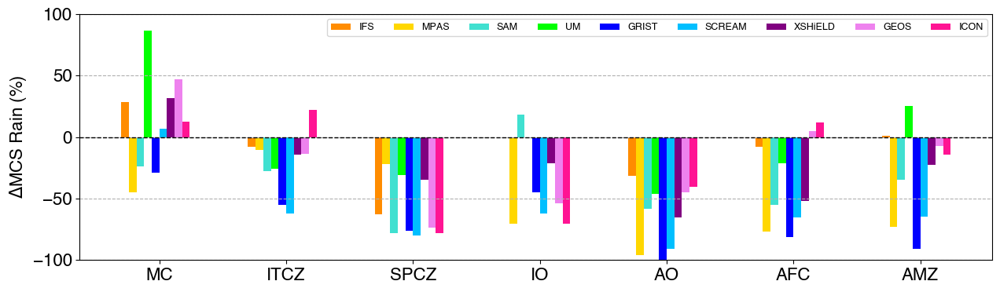

In [37]:
ylabel = f'$\Delta$MCS Rain (%)'
if PHASE == 'Winter':
    ylim = (-100,100)
if PHASE == 'Summer':
    ylim = (-100,100)
width = 0.06
figsize = [13,4]
figname = f'{figdir}globalmap_mcspcp_regional_meandiff_barchart.png'
legend_prop = {'ncol':len(name_map)-1, 'fontsize':9}
fig = bar_chart(dict_mcspcp, region_names, name_map, width=width, ylabel=ylabel, ylim=ylim, legend_prop=legend_prop, figsize=figsize, figname=figname)

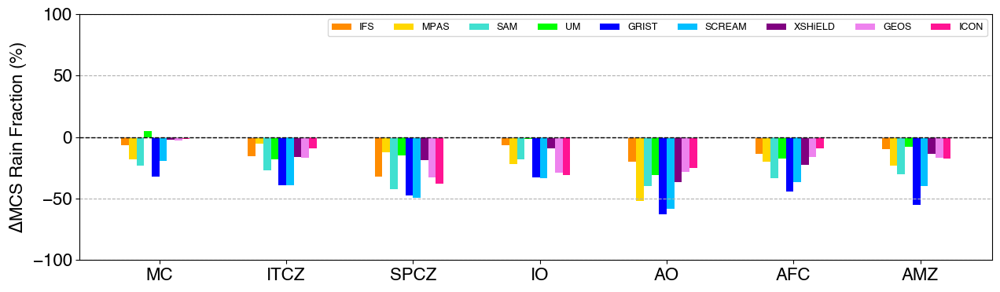

In [38]:
ylabel = f'$\Delta$MCS Rain Fraction (%)'
if PHASE == 'Winter':
    ylim = (-100,100)
if PHASE == 'Summer':
    ylim = (-100,100)
width = 0.06
figsize = [13,4]
figname = f'{figdir}globalmap_mcspcpfrac_regional_meandiff_barchart.png'
legend_prop = {'ncol':len(name_map)-1, 'fontsize':9}
fig = bar_chart(dict_mcspcpfrac, region_names, name_map, width=width, ylabel=ylabel, ylim=ylim, legend_prop=legend_prop, figsize=figsize, figname=figname)

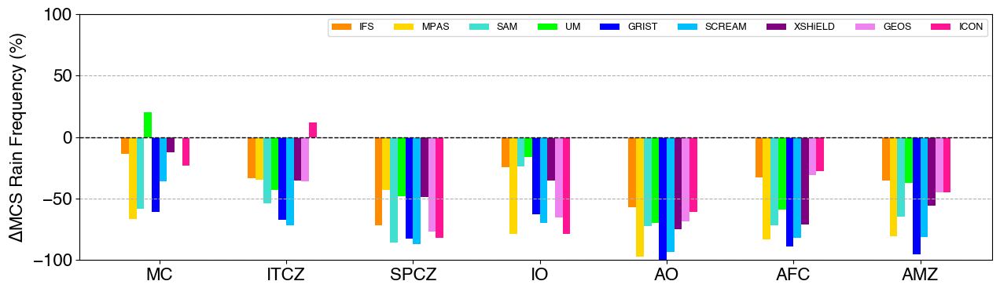

In [39]:
ylabel = f'$\Delta$MCS Rain Frequency (%)'
if PHASE == 'Winter':
    ylim = (-100,100)
if PHASE == 'Summer':
    ylim = (-100,100)
width = 0.06
figsize = [13,4]
figname = f'{figdir}globalmap_mcspcpfreq_regional_meandiff_barchart.png'
legend_prop = {'ncol':len(name_map)-1, 'fontsize':9}
fig = bar_chart(dict_mcspcpfreq, region_names, name_map, width=width, ylabel=ylabel, ylim=ylim, legend_prop=legend_prop, figsize=figsize, figname=figname)

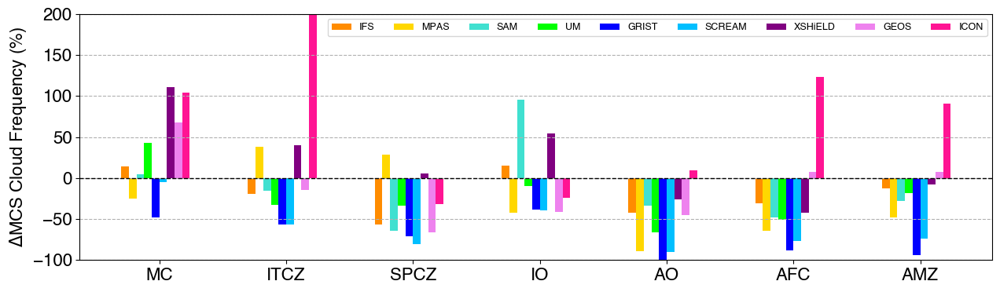

In [40]:
ylabel = f'$\Delta$MCS Cloud Frequency (%)'
if PHASE == 'Winter':
    ylim = (-100,200)
if PHASE == 'Summer':
    ylim = (-100,100)
width = 0.06
figsize = [13,4]
figname = f'{figdir}globalmap_mcscloudfreq_regional_meandiff_barchart.png'
legend_prop = {'ncol':len(name_map)-1, 'fontsize':9}
fig = bar_chart(dict_mcscloudfreq, region_names, name_map, width=width, ylabel=ylabel, ylim=ylim, legend_prop=legend_prop, figsize=figsize, figname=figname)

In [41]:
figname

'/global/cfs/cdirs/m1867/zfeng/MCSMIP/DYAMOND/Winter/figures/MOAAP/globalmap_mcscloudfreq_regional_meandiff_barchart.png'

## Function to plot 1 map and bar chart

In [42]:
def plot_map_bars(data_map, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                  oob_colors=None, contourf=False, figsize=None, fontsize=None, cb_fontsize=None,
                  boxes=None, boxtextloc=None, boxtext=None, boxtexttype=None, text_colors=None,
                  bar_data=None, bar_ylabel=None, legend_prop=None, bar_ylim=None):
                  # boxes=None, boxtextloc=None, dict_text_type=None, dict_text_val=None, text_colors=None, boxtext_fontsize=None):
    
    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'

    ###################################################
    # Map plot
    ###################################################
    map_extent = [-180., 179.5, -60.1, 60.1]
    lonv = np.arange(-180,180.1,30)
    latv = np.arange(-60,60.1,15)
    proj = ccrs.PlateCarree(central_longitude=0)
    data_proj = ccrs.PlateCarree()
    levelshgt = [1000,10000]

    fig = plt.figure(figsize=figsize, dpi=100)
    h_ratios = [0.05, 1, 1]
    gs = gridspec.GridSpec(3, 1, height_ratios=h_ratios, width_ratios=[1])
    gs.update(left=0.05, right=0.88, bottom=0.1, top=0.9, wspace=0.05, hspace=0.25)

    resolution = '110m'
    land = cfeature.NaturalEarthFeature('physical', 'land', resolution)
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', resolution)
    borders = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)
    
    ax = plt.subplot(gs[1,0], projection=proj)
    ax.set_extent(map_extent, crs=proj)
    ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
    ax.set_aspect('auto', adjustable=None)
    ax.set_title(titles[0], loc='left')
    
    # Grid lines & labels
    gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
    gl.xlocator = mpl.ticker.FixedLocator(lonv)
    gl.ylocator = mpl.ticker.FixedLocator(latv)         
    # if (row == nrow-1):
    ax.set_xticks(lonv, crs=data_proj)
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.set_yticks(latv, crs=data_proj)
    lat_formatter = LatitudeFormatter()
    ax.yaxis.set_major_formatter(lat_formatter)

    # Terrain height
    ct = ax.contour(lon_ter, lat_ter, ter_s, levels=[1000,1001], \
                    colors='dimgray', linewidths=1, transform=data_proj, zorder=3)
    
    # Select and mask data source
    Zm = np.ma.masked_where(np.isnan(data_map), data_map)
    cmap = copy.copy(mpl.colormaps.get_cmap(cmaps))
    # Set out-of-bounds colors
    if oob_colors is not None:
        cmap.set_over(oob_colors['over'])
        cmap.set_under(oob_colors['under'])
        # cf1.set_clim(min(levels), max(levels))
    norm = colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)
    # Plot data
    if (contourf == False):
        cf1 = ax.pcolormesh(lon, lat, Zm, shading='auto', norm=norm, cmap=cmap, transform=data_proj, zorder=2)
    else:
        cf1 = ax.contourf(lon, lat, Zm, levels=levels, norm=norm, cmap=cmap, transform=data_proj, extend='both', zorder=2)
    # # Set out-of-bounds colors
    # if oob_colors is not None:
    #     cf1.cmap.set_over(oob_colors['over'])
    #     cf1.cmap.set_under(oob_colors['under'])
    #     cf1.set_clim(min(levels), max(levels))
    # Colorbars
    cax1 = plt.subplot(gs[0,0])
    cb1 = plt.colorbar(cf1, cax=cax1, label=cblabels, ticks=cbticks, orientation='horizontal', extend='both')
    cb1.ax.xaxis.set_label_position('top')
    cb1.ax.tick_params(labelsize=cb_fontsize)
        
    # Plot boxes
    if boxes is not None:
        for ii in boxes:
            # Plot region boxes
            corners = [[boxes[ii][0],boxes[ii][2]], [boxes[ii][1],boxes[ii][2]], [boxes[ii][1],boxes[ii][3]], [boxes[ii][0],boxes[ii][3]]]
            box = Polygon(corners, edgecolor='k', facecolor='none', lw=2, transform=data_proj, zorder=10)
            ax.add_patch(box)

            if boxtexttype is None:
                text_color = text_colors['pos'] if (boxtext[ii] >=0) else text_colors['neg']
                ax.text(boxtextloc[ii][0], boxtextloc[ii][1], f"{boxtext[ii]:.00f}%", ha='center',
                        bbox=dict(facecolor='w', alpha=0.8, edgecolor=text_color),
                        fontsize=12, fontweight='bold', color=text_color, transform=data_proj, zorder=4)
            else:
                text_color = 'k'
                ax.text(boxtextloc[ii][0], boxtextloc[ii][1], f"{boxtext[ii]}", ha='center',
                        bbox=dict(facecolor='w', alpha=0.8, edgecolor=text_color),
                        fontsize=12, fontweight='bold', color=text_color, transform=data_proj, zorder=4)

    
    ###################################################
    # Bar chart
    ###################################################
    ax2 = plt.subplot(gs[2,0])
    labels = list(boxes.keys())
    x = np.arange(len(labels))
    multiplier = -((len(name_map)-1)/2)
    lcolors = {
        'obs':'k', 
        'm1': 'crimson',
        'm2': 'darkorange', 
        'm3': 'gold',
        'm4': 'green',
        'm5': 'turquoise',
        'm6': 'lime',
        'm7': 'blue',
        'm8': 'deepskyblue',
        'm9': 'purple',
        'm10': 'violet',
        'm11': 'deeppink',
    }

    # Loop over each source    
    for key, val in bar_data.items():
        offset = width * multiplier
        rects = ax2.bar(x + offset, val, width, color=lcolors[key], label=name_map[key])
        multiplier += 1    

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax2.set_ylabel(bar_ylabel)
    ax2.set_title(titles[1], loc='left')
    ax2.set_xticks(x, labels)
    ax2.legend(ncol=legend_prop['ncol'], fontsize=legend_prop['fontsize'])
    ax2.axhline(y=0, lw=1, ls='--', color='k')
    ax2.grid(which='major', ls='--', axis='y')
    ax2.set_ylim(bar_ylim[0], bar_ylim[1])
    
    fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w')
    return fig

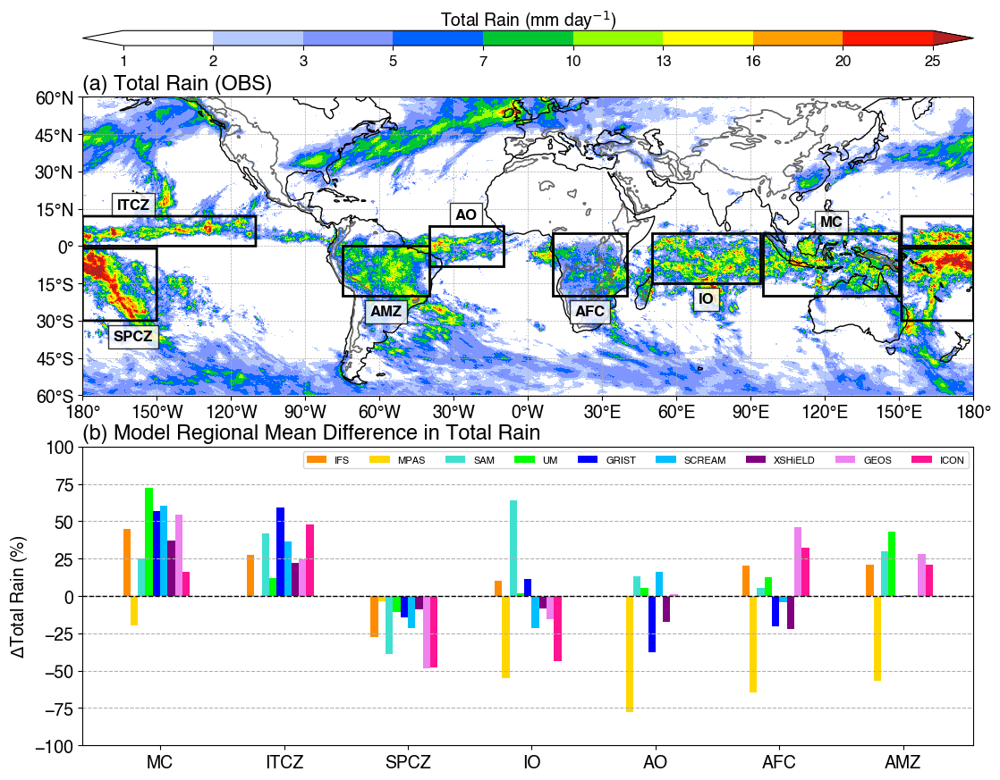

In [43]:
figsize = [12,10]
fontsize = 14
cb_fontsize = 12
varname1 = 'Total Rain'
varname2 = '$\Delta$Total Rain'
units = 'mm day$^{-1}$'

# Map data
data_dict = totpcp_obs
levels = [1,2,3,5,7,10,13,16,20,25]
cmaps = generate_NCL_cmap('precip3_16lev', cont_param_ws='sRGB')
titles = [f'(a) {varname1} (OBS)', f'(b) Model Regional Mean Difference in {varname1}']
cbticks = levels
oob_colors = {'under':'white', 'over':'firebrick'}
cblabels = f'{varname1} ({units})'
text_colors = None
text_val = dict(zip(boxes.keys(),boxes.keys()))

# Bar chart data
bar_data = dict_totpcp
bar_ylabel = f'{varname2} (%)'
bar_ylim = (-100,100)
legend_prop = {'ncol':len(name_map)-1, 'fontsize':8}

figname = f'{figdir}globalmap_total_rain_obs_barchart_diff.png'

fig = plot_map_bars(data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                    boxes=boxes, boxtextloc=text_loc, boxtext=text_val, boxtexttype='string',
                    bar_data=bar_data, bar_ylabel=bar_ylabel, legend_prop=legend_prop, bar_ylim=bar_ylim)

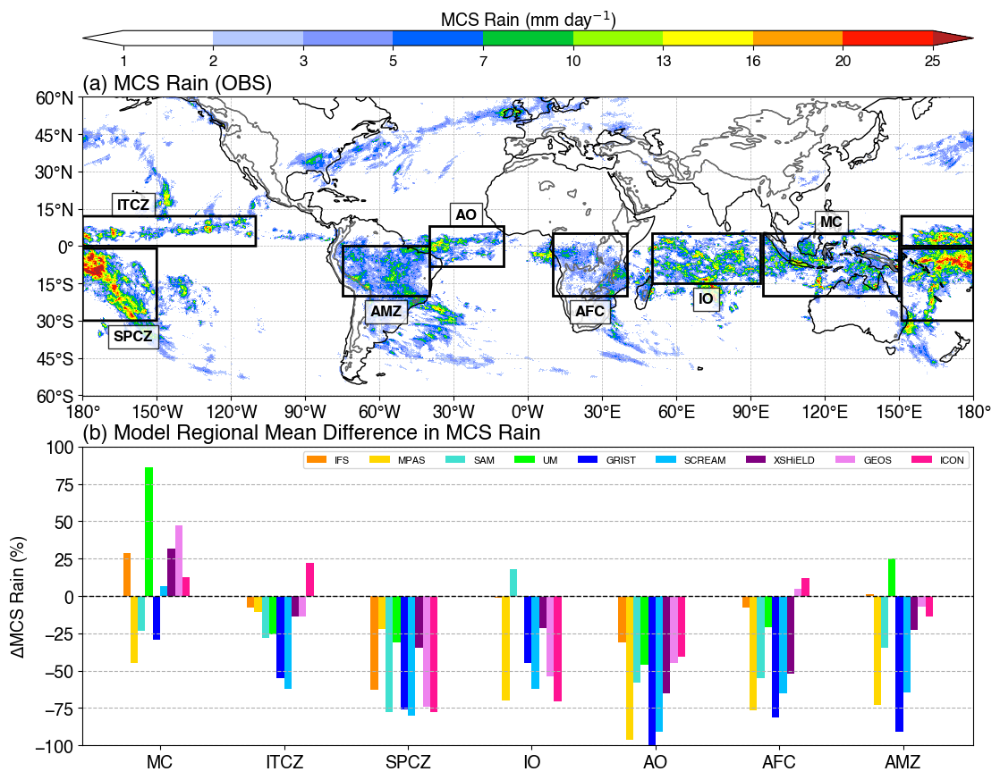

In [44]:
figsize = [12,10]
fontsize = 14
cb_fontsize = 12
varname1 = 'MCS Rain'
varname2 = '$\Delta$MCS Rain'
units = 'mm day$^{-1}$'

# Map data
data_dict = mcspcp_obs
levels = [1,2,3,5,7,10,13,16,20,25]
cmaps = generate_NCL_cmap('precip3_16lev', cont_param_ws='sRGB')
titles = [f'(a) {varname1} (OBS)', f'(b) Model Regional Mean Difference in {varname1}']
cbticks = levels
oob_colors = {'under':'white', 'over':'firebrick'}
cblabels = f'{varname1} ({units})'
text_colors = None
text_val = dict(zip(boxes.keys(),boxes.keys()))

# Bar chart data
bar_data = dict_mcspcp
bar_ylabel = f'{varname2} (%)'
bar_ylim = (-100,100)
legend_prop = {'ncol':len(name_map)-1, 'fontsize':8}

figname = f'{figdir}globalmap_mcs_rain_obs_barchart_diff.png'

fig = plot_map_bars(data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                    boxes=boxes, boxtextloc=text_loc, boxtext=text_val, boxtexttype='string',
                    bar_data=bar_data, bar_ylabel=bar_ylabel, legend_prop=legend_prop, bar_ylim=bar_ylim)

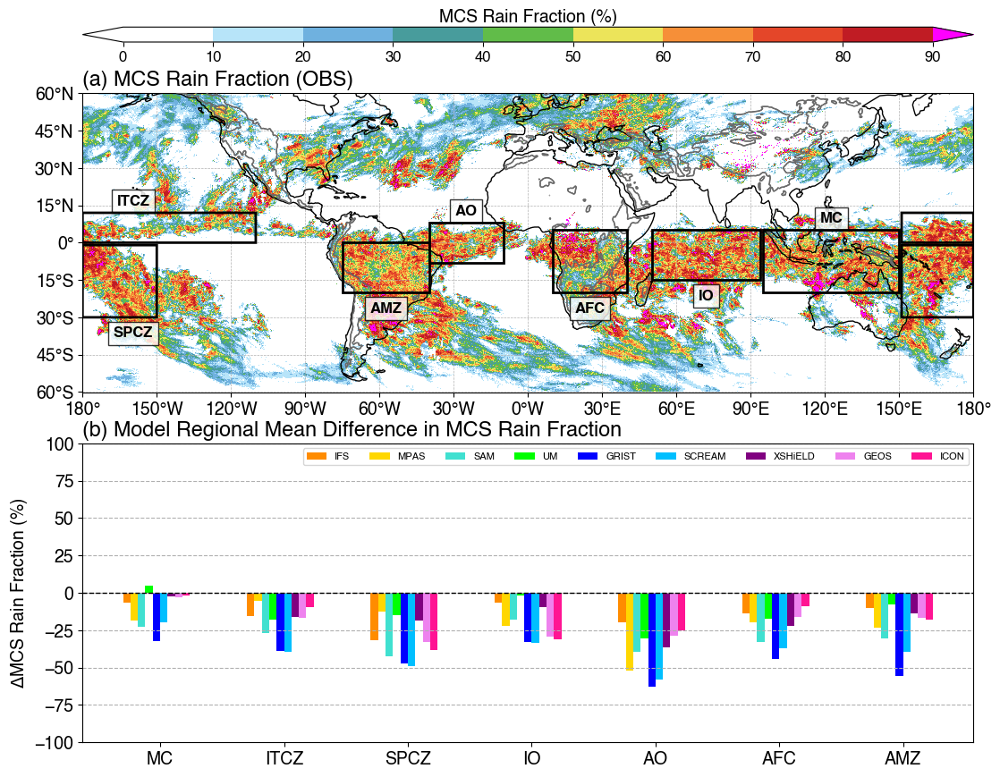

In [45]:
figsize = [12,10]
fontsize = 14
cb_fontsize = 12
varname1 = 'MCS Rain Fraction'
varname2 = '$\Delta$MCS Rain Fraction'
units = '%'

# Map data
data_dict = mcspcpfrac_obs
levels = np.arange(0, 90.01, 10)
cmaps = generate_NCL_cmap('WhiteBlueGreenYellowRed')
cmaps = truncate_colormap(cmaps, 0.0, 0.9)
titles = [f'(a) {varname1} (OBS)', f'(b) Model Regional Mean Difference in {varname1}']
cbticks = levels
oob_colors = {'under':'white', 'over':'magenta'}
cblabels = f'{varname1} ({units})'
text_colors = None
text_val = dict(zip(boxes.keys(),boxes.keys()))

# Bar chart data
bar_data = dict_mcspcpfrac
bar_ylabel = f'{varname2} (%)'
bar_ylim = (-100,100)
legend_prop = {'ncol':len(name_map)-1, 'fontsize':8}

figname = f'{figdir}globalmap_mcs_rainfrac_obs_barchart_diff.png'

fig = plot_map_bars(data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                    boxes=boxes, boxtextloc=text_loc, boxtext=text_val, boxtexttype='string',
                    bar_data=bar_data, bar_ylabel=bar_ylabel, legend_prop=legend_prop, bar_ylim=bar_ylim)

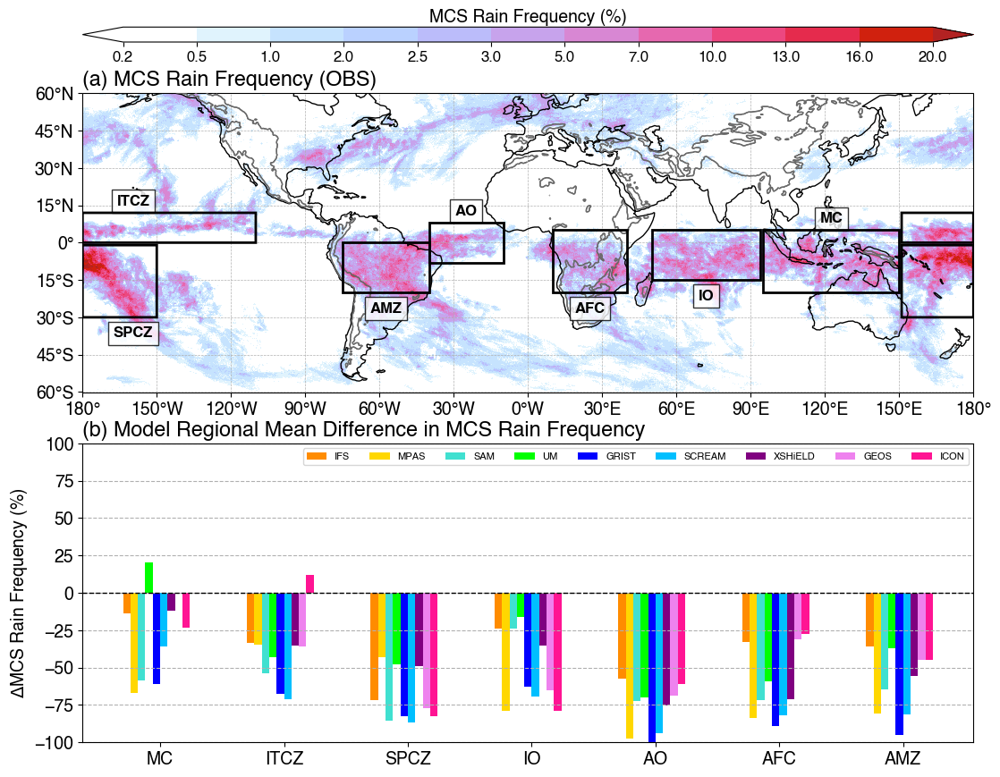

In [46]:
figsize = [12,10]
fontsize = 14
cb_fontsize = 12
varname1 = 'MCS Rain Frequency'
varname2 = '$\Delta$MCS Rain Frequency'
units = '%'

# Map data
data_dict = mcspcpfreq_obs
levels = [0.2,0.5,1,2,2.5,3,5,7,10,13,16,20]
cmaps = cc.cm.CET_L19
titles = [f'(a) {varname1} (OBS)', f'(b) Model Regional Mean Difference in {varname1}']
cbticks = levels
oob_colors = {'under':'white', 'over':'firebrick'}
cblabels = f'{varname1} ({units})'
text_colors = None
text_val = dict(zip(boxes.keys(),boxes.keys()))

# Bar chart data
bar_data = dict_mcspcpfreq
bar_ylabel = f'{varname2} (%)'
bar_ylim = (-100,100)
legend_prop = {'ncol':len(name_map)-1, 'fontsize':8}

figname = f'{figdir}globalmap_mcs_rainfreq_obs_barchart_diff.png'

fig = plot_map_bars(data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                    boxes=boxes, boxtextloc=text_loc, boxtext=text_val, boxtexttype='string',
                    bar_data=bar_data, bar_ylabel=bar_ylabel, legend_prop=legend_prop, bar_ylim=bar_ylim)

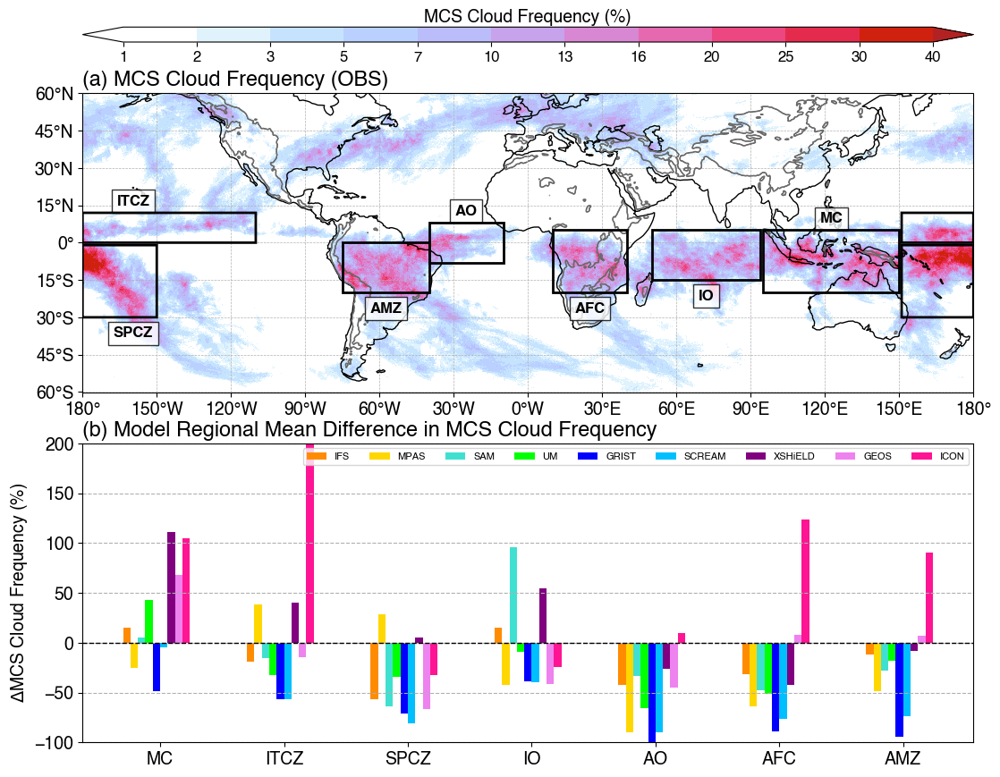

In [47]:
figsize = [12,10]
fontsize = 14
cb_fontsize = 12
varname1 = 'MCS Cloud Frequency'
varname2 = '$\Delta$MCS Cloud Frequency'
units = '%'

# Map data
data_dict = mcscloudfreq_obs
levels = [1,2,3,5,7,10,13,16,20,25,30,40]
cmaps = cc.cm.CET_L19
titles = [f'(a) {varname1} (OBS)', f'(b) Model Regional Mean Difference in {varname1}']
cbticks = levels
oob_colors = {'under':'white', 'over':'firebrick'}
cblabels = f'{varname1} ({units})'
text_colors = None
text_val = dict(zip(boxes.keys(),boxes.keys()))

# Bar chart data
bar_data = dict_mcscloudfreq
bar_ylabel = f'{varname2} (%)'
bar_ylim = (-100,200)
legend_prop = {'ncol':len(name_map)-1, 'fontsize':8}

figname = f'{figdir}globalmap_mcs_cloudfreq_obs_barchart_diff.png'

fig = plot_map_bars(data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                    boxes=boxes, boxtextloc=text_loc, boxtext=text_val, boxtexttype='string',
                    bar_data=bar_data, bar_ylabel=bar_ylabel, legend_prop=legend_prop, bar_ylim=bar_ylim)

## Function to plot multi-row maps for all sources

In [48]:
def plot_maps_nrow(nrow, data_dict, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                   oob_colors=None, contourf=False, figsize=None, fontsize=None, cb_fontsize=None,
                   boxes=None, boxtextloc=None, dict_text_type=None, dict_text_val=None, text_colors=None, boxtext_fontsize=None):
    
    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'

    map_extent = [-180., 179.5, -60.1, 60.1]
    lonv = np.arange(-180,180.1,30)
    latv = np.arange(-60,60.1,15)
    proj = ccrs.PlateCarree(central_longitude=0)
    data_proj = ccrs.PlateCarree()
    levelshgt = [1000,10000]

    fig = plt.figure(figsize=figsize, dpi=100)
    h_ratios = [0.05] + list(np.repeat(1,nrow)) + [0.05]
    gs = gridspec.GridSpec(nrow+2, 1, height_ratios=h_ratios, width_ratios=[1])
    gs.update(left=0.05, right=0.88, bottom=0.1, top=0.9, wspace=0.05, hspace=0.13)

    resolution = '110m'
    land = cfeature.NaturalEarthFeature('physical', 'land', resolution)
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', resolution)
    borders = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)
    
    cf_save = []
    for row in range(0, nrow):
        ax = plt.subplot(gs[row+1,0], projection=proj)
        ax.set_extent(map_extent, crs=proj)
        ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
        ax.set_aspect('auto', adjustable=None)
        # Title
        flabel = ax.text(0.02, 0.05, titles[row], transform=ax.transAxes, fontsize=None)
        flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
        
        # Grid lines & labels
        gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
        gl.xlocator = mpl.ticker.FixedLocator(lonv)
        gl.ylocator = mpl.ticker.FixedLocator(latv)         
        if (row == nrow-1):
            ax.set_xticks(lonv, crs=data_proj)
            lon_formatter = LongitudeFormatter(zero_direction_label=True)
            ax.xaxis.set_major_formatter(lon_formatter)
        ax.set_yticks(latv, crs=data_proj)
        lat_formatter = LatitudeFormatter()
        ax.yaxis.set_major_formatter(lat_formatter)
        
        # Terrain height
        ct = ax.contour(lon_ter, lat_ter, ter_s, levels=[1000,1001], \
                        colors='dimgray', linewidths=1, transform=data_proj, zorder=3)

        # Select and mask data source
        data = data_dict.isel(source=row)
        Zm = np.ma.masked_where(np.isnan(data), data)
        cmap = copy.copy(mpl.colormaps.get_cmap(cmaps[row]))
        # Set out-of-bounds colors
        if oob_colors is not None:
            oob_c = oob_colors[row]
            if oob_c is not None:
                cmap.set_over(oob_c['over'])
                cmap.set_under(oob_c['under'])
        norm = colors.BoundaryNorm(boundaries=levels[row], ncolors=cmap.N)
        # Plot data
        if (contourf == False):
            cf1 = ax.pcolormesh(lon, lat, Zm, shading='auto', norm=norm, cmap=cmap, transform=data_proj, zorder=2)
        else:
            cf1 = ax.contourf(lon, lat, Zm, levels=levels[row], norm=norm, cmap=cmap, transform=data_proj, extend='both', zorder=2)
        cf_save.append(cf1)

        # Plot regional boxes
        if boxes is not None:
            # Loop over each box dictionary
            for ii in boxes:
                # Plot region boxes
                corners = [[boxes[ii][0],boxes[ii][2]], [boxes[ii][1],boxes[ii][2]], [boxes[ii][1],boxes[ii][3]], [boxes[ii][0],boxes[ii][3]]]
                box = Polygon(corners, edgecolor='k', facecolor='none', lw=2, transform=data_proj, zorder=10)
                ax.add_patch(box)
                
                # Get key using row number
                key = list(dict_text_type.keys())[row]
                boxtexttype = dict_text_type[key]
                boxtext = dict_text_val[key]
                
                # Plot box text
                if boxtexttype == 'float':
                    text_color = text_colors['pos'] if (boxtext[ii] >=0) else text_colors['neg']
                    ax.text(boxtextloc[ii][0], boxtextloc[ii][1], f"{boxtext[ii]:.00f}%", ha='center',
                            bbox=dict(facecolor='w', alpha=0.8, edgecolor=text_color),
                            fontsize=boxtext_fontsize, fontweight='bold', color=text_color, transform=data_proj, zorder=4)
                if boxtexttype == 'string':
                    text_color = 'k'
                    ax.text(boxtextloc[ii][0], boxtextloc[ii][1], f"{boxtext[ii]}", ha='center',
                            bbox=dict(facecolor='w', alpha=0.8, edgecolor=text_color),
                            fontsize=boxtext_fontsize, fontweight='bold', color=text_color, transform=data_proj, zorder=4)
                
    # Colorbars
    cax1 = plt.subplot(gs[0,0])
    cax2 = plt.subplot(gs[-1,0])
    cb1 = plt.colorbar(cf_save[0], cax=cax1, label=cblabels[0], ticks=cbticks[0], orientation='horizontal', extend='both')
    cb2 = plt.colorbar(cf_save[-1], cax=cax2, label=cblabels[1], ticks=cbticks[1], orientation='horizontal', extend='both')
    cb1.ax.xaxis.set_label_position('top')
        # # cb1.set_label(cblabel, fontsize=14)
    cb1.ax.tick_params(labelsize=cb_fontsize)
    
    fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w')
    return fig

In [49]:
# Combine region names & model difference values to a dictionary
dict1 = {'obs': list(boxes.keys())}
dict_text_combine = {**dict1, **dict_totpcp}
# Make dictionary key with region names
dict_text_val = {}
for key, val in name_map.items():
    boxtext = dict_text_combine[key]
    dict_text_val[key] = dict(zip(boxes.keys(), boxtext))

# Make text type for each source
dict1 = {'obs': 'string'}
dict2 = {key: 'float' for key in dict_totpcp}
dict_text_type = {**dict1, **dict2}
# dict_text_type

print(dict_text_val)

{'obs': {'MC': 'MC', 'ITCZ': 'ITCZ', 'SPCZ': 'SPCZ', 'IO': 'IO', 'AO': 'AO', 'AFC': 'AFC', 'AMZ': 'AMZ'}, 'm2': {'MC': 44.90927505493164, 'ITCZ': 27.74512481689453, 'SPCZ': -27.68191909790039, 'IO': 10.34092903137207, 'AO': 0.2370067685842514, 'AFC': 20.276113510131836, 'AMZ': 20.990478515625}, 'm3': {'MC': -19.900663375854492, 'ITCZ': -0.3615512549877167, 'SPCZ': -3.328883171081543, 'IO': -54.83774185180664, 'AO': -77.77935791015625, 'AFC': -64.4434814453125, 'AMZ': -56.51681900024414}, 'm5': {'MC': 25.398632049560547, 'ITCZ': 41.99247360229492, 'SPCZ': -38.728111267089844, 'IO': 64.24522399902344, 'AO': 12.927475929260254, 'AFC': 5.439953804016113, 'AMZ': 29.7803897857666}, 'm6': {'MC': 72.42733764648438, 'ITCZ': 11.851747512817383, 'SPCZ': -10.48066234588623, 'IO': 1.9449957609176636, 'AO': 5.2157135009765625, 'AFC': 12.507760047912598, 'AMZ': 43.33614730834961}, 'm7': {'MC': 56.66177749633789, 'ITCZ': 58.982086181640625, 'SPCZ': -14.608417510986328, 'IO': 11.258405685424805, 'AO': 

In [50]:
print(2.84 / ds.dims['source'])
height_ratio_per_panel = 0.36
height_ratio_per_panel * ds.dims['source']

0.284


3.5999999999999996

In [51]:
# figwidth = 12
# # ratio = 2.84
# height_ratio_per_panel = 0.36
# ratio = height_ratio_per_panel * ds.dims['source']
# figsize = [figwidth,figwidth*ratio]
# fontsize = 12
# cb_fontsize = 10
# varname1 = 'Total Rain'
# varname2 = '$\Delta$Total Rain'
# units = 'mm day$^{-1}$'

# # Combine OBS & model differences
# data_dict = xr.concat([totpcp_obs, totpcp_diff], dim='source')
# # data_dict = xr.concat([totpcp_obs, totpcp_diff.sel(source=['m1','m2','m3'])], dim='source')
# lev1 = [1,2,3,5,7,10,13,16,20,25]
# lev2 = [-20,-16,-12,-8,-4,4,8,12,16,20]
# cmap1 = generate_NCL_cmap('precip3_16lev', cont_param_ws='sRGB')
# cmap2 = 'BrBG'

# nrows = len(name_map)
# nmodel = nrows-1
# titles = []
# for ii in range(len(name_map)):
#     key = list(name_map.keys())[ii]
#     label = '('+chr(ord('a') + ii)+')'
#     if key == 'obs': 
#         titles.append(f'{label} {varname1} ({name_map[key]})')
#     else:
#         titles.append(f'{label} {varname2} ({name_map[key]} - OBS)')

# levels = [lev1] + [lev2]*nmodel
# cbticks = levels
# cmaps = [cmap1] + [cmap2]*nmodel
# oob_colors = [{'under':'white', 'over':'firebrick'}] + [None]*nmodel
# cblabels = [f'{varname1} ({units})', f'{varname2} ({units})']
# text_colors = {'pos':'teal', 'neg':'darkgoldenrod'}

# figname = f'{figdir}globalmap_total_rain_obs_diff_all.png'
# fig = plot_maps_nrow(nrows, data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
#                      figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
#                      boxes=boxes, boxtextloc=text_loc, dict_text_type=dict_text_type, dict_text_val=dict_text_val, text_colors=text_colors)

In [52]:
# Combine region names & model difference values to a dictionary
dict1 = {'obs': list(boxes.keys())}
dict_text_combine = {**dict1, **dict_mcspcp}
# Make dictionary key with region names
dict_text_val = {}
for key, val in name_map.items():
    boxtext = dict_text_combine[key]
    dict_text_val[key] = dict(zip(boxes.keys(), boxtext))

# Make text type for each source
dict1 = {'obs': 'string'}
dict2 = {key: 'float' for key in dict_mcspcp}
dict_text_type = {**dict1, **dict2}
# dict_text_type

print(dict_text_val)

{'obs': {'MC': 'MC', 'ITCZ': 'ITCZ', 'SPCZ': 'SPCZ', 'IO': 'IO', 'AO': 'AO', 'AFC': 'AFC', 'AMZ': 'AMZ'}, 'm2': {'MC': 28.42725944519043, 'ITCZ': -8.050979614257812, 'SPCZ': -62.70295333862305, 'IO': -0.9455907344818115, 'AO': -31.311355590820312, 'AFC': -7.816957950592041, 'AMZ': 0.9510896801948547}, 'm3': {'MC': -44.75474166870117, 'ITCZ': -10.64346981048584, 'SPCZ': -21.921979904174805, 'IO': -70.16822814941406, 'AO': -96.1386489868164, 'AFC': -76.64684295654297, 'AMZ': -73.16876220703125}, 'm5': {'MC': -23.537137985229492, 'ITCZ': -27.846176147460938, 'SPCZ': -77.9919662475586, 'IO': 18.004562377929688, 'AO': -58.075096130371094, 'AFC': -55.02461242675781, 'AMZ': -34.75802993774414}, 'm6': {'MC': 86.36919403076172, 'ITCZ': -25.464059829711914, 'SPCZ': -30.85389518737793, 'IO': -0.5120570063591003, 'AO': -46.220523834228516, 'AFC': -21.19805145263672, 'AMZ': 25.10295295715332}, 'm7': {'MC': -29.023908615112305, 'ITCZ': -54.89244079589844, 'SPCZ': -75.98387145996094, 'IO': -45.015533

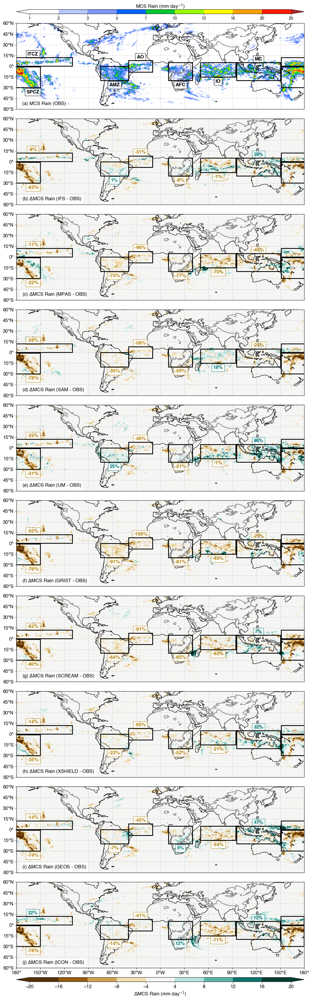

In [53]:
figwidth = 12
# ratio = 2.84
height_ratio_per_panel = 0.35
ratio = height_ratio_per_panel * ds.dims['source']
figsize = [figwidth,figwidth*ratio]
fontsize = 12
cb_fontsize = 10
varname1 = 'MCS Rain'
varname2 = '$\Delta$MCS Rain'
units = 'mm day$^{-1}$'

# Combine OBS & model differences
data_dict = xr.concat([mcspcp_obs, mcspcp_diff], dim='source')
lev1 = [1,2,3,5,7,10,13,16,20,25]
lev2 = [-20,-16,-12,-8,-4,4,8,12,16,20]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_param_ws='sRGB')
cmap2 = 'BrBG'

nrows = len(name_map)
nmodel = nrows-1
titles = []
for ii in range(len(name_map)):
    key = list(name_map.keys())[ii]
    label = '('+chr(ord('a') + ii)+')'
    if key == 'obs': 
        titles.append(f'{label} {varname1} ({name_map[key]})')
    else:
        titles.append(f'{label} {varname2} ({name_map[key]} - OBS)')

levels = [lev1] + [lev2]*nmodel
cbticks = levels
cmaps = [cmap1] + [cmap2]*nmodel
oob_colors = [{'under':'white', 'over':'firebrick'}] + [None]*nmodel
cblabels = [f'{varname1} ({units})', f'{varname2} ({units})']
text_colors = {'pos':'teal', 'neg':'darkgoldenrod'}

figname = f'{figdir}globalmap_mcs_rain_obs_diff_all.png'
fig = plot_maps_nrow(nrows, data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                     figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                     boxes=boxes, boxtextloc=text_loc, dict_text_type=dict_text_type, dict_text_val=dict_text_val, text_colors=text_colors)

In [54]:
# Combine region names & model difference values to a dictionary
dict1 = {'obs': list(boxes.keys())}
dict_text_combine = {**dict1, **dict_mcspcpfreq}
# Make dictionary key with region names
dict_text_val = {}
for key, val in name_map.items():
    boxtext = dict_text_combine[key]
    dict_text_val[key] = dict(zip(boxes.keys(), boxtext))

# Make text type for each source
dict1 = {'obs': 'string'}
dict2 = {key: 'float' for key in dict_mcspcpfreq}
dict_text_type = {**dict1, **dict2}
# dict_text_type

print(dict_text_val)

{'obs': {'MC': 'MC', 'ITCZ': 'ITCZ', 'SPCZ': 'SPCZ', 'IO': 'IO', 'AO': 'AO', 'AFC': 'AFC', 'AMZ': 'AMZ'}, 'm2': {'MC': -13.903743743896484, 'ITCZ': -33.40361404418945, 'SPCZ': -71.58406829833984, 'IO': -24.193132400512695, 'AO': -57.10643005371094, 'AFC': -32.89263153076172, 'AMZ': -35.60490417480469}, 'm3': {'MC': -66.70752716064453, 'ITCZ': -34.38607406616211, 'SPCZ': -43.20505905151367, 'IO': -78.66930389404297, 'AO': -97.22212982177734, 'AFC': -83.39601135253906, 'AMZ': -80.6859130859375}, 'm5': {'MC': -58.630104064941406, 'ITCZ': -53.645198822021484, 'SPCZ': -85.55120086669922, 'IO': -24.104230880737305, 'AO': -72.17588806152344, 'AFC': -71.69495391845703, 'AMZ': -64.49617004394531}, 'm6': {'MC': 20.13844871520996, 'ITCZ': -42.77354431152344, 'SPCZ': -47.91154861450195, 'IO': -16.298185348510742, 'AO': -69.70384216308594, 'AFC': -59.227535247802734, 'AMZ': -37.050384521484375}, 'm7': {'MC': -61.037837982177734, 'ITCZ': -67.3172378540039, 'SPCZ': -82.44617462158203, 'IO': -63.02562

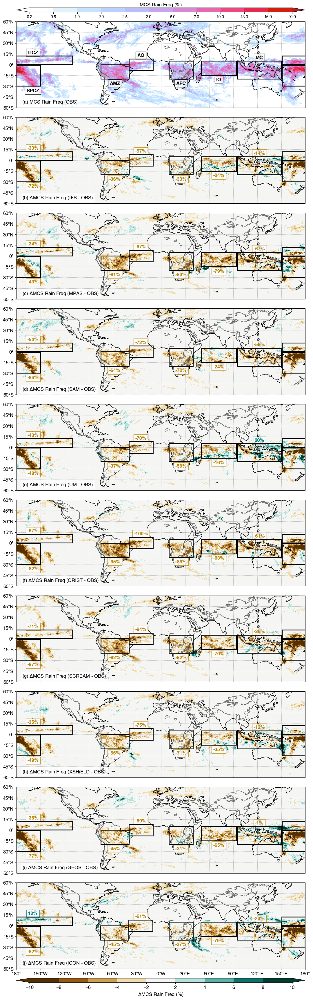

In [55]:
figwidth = 12
height_ratio_per_panel = 0.35 
ratio = height_ratio_per_panel * ds.dims['source']
figsize = [figwidth,figwidth*ratio]
fontsize = 12
cb_fontsize = 10
varname1 = 'MCS Rain Freq'
varname2 = '$\Delta$MCS Rain Freq'
units = '%'

# Combine OBS & model differences
data_dict = xr.concat([mcspcpfreq_obs, mcspcpfreq_diff], dim='source')
lev1 = [0.2,0.5,1,2,2.5,3,5,7,10,13,16,20]
lev2 = np.arange(-10, 10.1, 2)
lev2 = np.delete(lev2, int((len(lev2)-1)/2))
cmap1 = cc.cm.CET_L19
cmap2 = 'BrBG'

nrows = len(name_map)
nmodel = nrows-1
titles = []
for ii in range(len(name_map)):
    key = list(name_map.keys())[ii]
    label = '('+chr(ord('a') + ii)+')'
    if key == 'obs': 
        titles.append(f'{label} {varname1} ({name_map[key]})')
    else:
        titles.append(f'{label} {varname2} ({name_map[key]} - OBS)')

levels = [lev1] + [lev2]*nmodel
cbticks = levels
cmaps = [cmap1] + [cmap2]*nmodel
oob_colors = [{'under':'white', 'over':'firebrick'}] + [None]*nmodel
cblabels = [f'{varname1} ({units})', f'{varname2} ({units})']
text_colors = {'pos':'teal', 'neg':'darkgoldenrod'}

figname = f'{figdir}globalmap_mcs_rainfreq_obs_diff_all.png'
fig = plot_maps_nrow(nrows, data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                     figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                     boxes=boxes, boxtextloc=text_loc, dict_text_type=dict_text_type, dict_text_val=dict_text_val, text_colors=text_colors)

In [65]:
# lev1 = [0.2,0.5,1,2,2.5,3,5,7,10,13,16,20]
# # lev1 = np.arange(0, 18.1, 1)
# # cmap = copy.copy(mpl.colormaps.get_cmap('plasma'))
# cmap = cc.cm.CET_L19
# norm = colors.BoundaryNorm(boundaries=lev1, ncolors=cmap.N)
# plt.pcolormesh(mcspcpfreq_obs, norm=norm, cmap=cmap)
# plt.colorbar()

In [57]:
# Combine region names & model difference values to a dictionary
dict1 = {'obs': list(boxes.keys())}
dict_text_combine = {**dict1, **dict_mcscloudfreq}
# Make dictionary key with region names
dict_text_val = {}
for key, val in name_map.items():
    boxtext = dict_text_combine[key]
    dict_text_val[key] = dict(zip(boxes.keys(), boxtext))

# Make text type for each source
dict1 = {'obs': 'string'}
dict2 = {key: 'float' for key in dict_mcscloudfreq}
dict_text_type = {**dict1, **dict2}
# dict_text_type

print(dict_text_val)

{'obs': {'MC': 'MC', 'ITCZ': 'ITCZ', 'SPCZ': 'SPCZ', 'IO': 'IO', 'AO': 'AO', 'AFC': 'AFC', 'AMZ': 'AMZ'}, 'm2': {'MC': 14.619794845581055, 'ITCZ': -19.336158752441406, 'SPCZ': -56.802913665771484, 'IO': 15.068105697631836, 'AO': -42.38294219970703, 'AFC': -31.177263259887695, 'AMZ': -12.208600044250488}, 'm3': {'MC': -25.190034866333008, 'ITCZ': 38.550376892089844, 'SPCZ': 28.2281494140625, 'IO': -42.272254943847656, 'AO': -89.51522064208984, 'AFC': -64.26126861572266, 'AMZ': -48.39527130126953}, 'm5': {'MC': 4.833652019500732, 'ITCZ': -15.065971374511719, 'SPCZ': -64.07384490966797, 'IO': 95.84093475341797, 'AO': -33.4206657409668, 'AFC': -47.92142105102539, 'AMZ': -28.042940139770508}, 'm6': {'MC': 43.08121109008789, 'ITCZ': -32.62464904785156, 'SPCZ': -34.087440490722656, 'IO': -9.413077354431152, 'AO': -66.0122299194336, 'AFC': -51.00880813598633, 'AMZ': -18.280620574951172}, 'm7': {'MC': -48.345035552978516, 'ITCZ': -56.58320617675781, 'SPCZ': -71.45374298095703, 'IO': -38.3186721

In [58]:
# lev1 = [1,2,3,5,7,10,13,16,20,25,30,40]
# # lev1 = np.arange(0, 18.1, 1)
# # cmap = copy.copy(mpl.colormaps.get_cmap('plasma'))
# cmap = cc.cm.CET_L19
# norm = colors.BoundaryNorm(boundaries=lev1, ncolors=cmap.N)
# plt.pcolormesh(mcscloudfreq_obs, norm=norm, cmap=cmap)
# plt.colorbar()

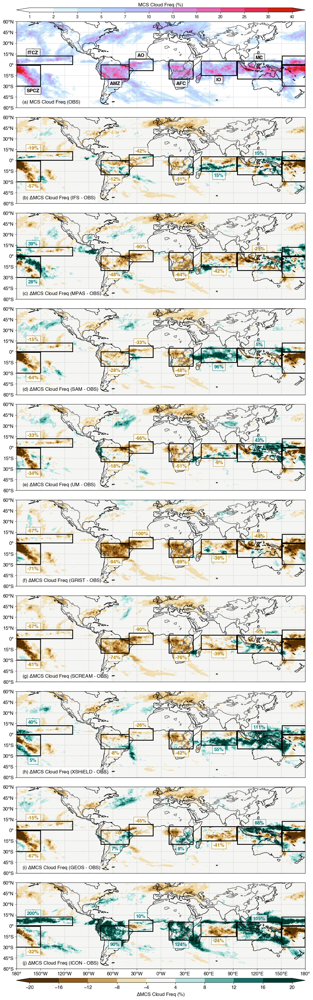

In [59]:
figwidth = 12
height_ratio_per_panel = 0.35 
ratio = height_ratio_per_panel * ds.dims['source']
figsize = [figwidth,figwidth*ratio]
fontsize = 12
cb_fontsize = 10
varname1 = 'MCS Cloud Freq'
varname2 = '$\Delta$MCS Cloud Freq'
units = '%'

# Combine OBS & model differences
data_dict = xr.concat([mcscloudfreq_obs, mcscloudfreq_diff], dim='source')
lev1 = [1,2,3,5,7,10,13,16,20,25,30,40]
lev2 = np.arange(-20, 20.1, 4)
lev2 = np.delete(lev2, int((len(lev2)-1)/2))
cmap1 = cc.cm.CET_L19
cmap2 = 'BrBG'

nrows = len(name_map)
nmodel = nrows-1
titles = []
for ii in range(len(name_map)):
    key = list(name_map.keys())[ii]
    label = '('+chr(ord('a') + ii)+')'
    if key == 'obs': 
        titles.append(f'{label} {varname1} ({name_map[key]})')
    else:
        titles.append(f'{label} {varname2} ({name_map[key]} - OBS)')

levels = [lev1] + [lev2]*nmodel
cbticks = levels
cmaps = [cmap1] + [cmap2]*nmodel
oob_colors = [{'under':'white', 'over':'firebrick'}] + [None]*nmodel
cblabels = [f'{varname1} ({units})', f'{varname2} ({units})']
text_colors = {'pos':'teal', 'neg':'darkgoldenrod'}

figname = f'{figdir}globalmap_mcs_cloudfreq_obs_diff_all.png'
fig = plot_maps_nrow(nrows, data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                     figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                     boxes=boxes, boxtextloc=text_loc, dict_text_type=dict_text_type, dict_text_val=dict_text_val, text_colors=text_colors)

In [60]:
dict_mcspcpfrac

{'m2': array([ -6.67901779, -15.25413269, -31.8569825 ,  -6.61004257,
        -19.79843188, -13.505311  , -10.12399974]),
 'm3': array([-18.22079254,  -5.61750168, -12.6525338 , -21.93617248,
        -51.97342731, -19.84473513, -23.40789714]),
 'm5': array([-22.91564346, -26.77481789, -42.15550355, -18.19331741,
        -39.55092097, -33.15741061, -30.39681545]),
 'm6': array([  4.74802613, -18.1612677 , -14.97150734,  -1.55750656,
        -30.75181628, -17.32236193,  -7.77545848]),
 'm7': array([-32.11764503, -38.99190182, -47.28268746, -32.68550109,
        -62.90456058, -44.15393542, -55.34324565]),
 'm8': array([-19.67872406, -39.21587796, -49.07081536, -33.72523307,
        -58.11732818, -36.79673861, -39.58800045]),
 'm9': array([ -2.28486801, -16.14774079, -18.79652337,  -9.27986526,
        -36.60152865, -22.3121271 , -13.92843929]),
 'm10': array([ -2.6895845 , -16.66265625, -32.61346367, -29.27783203,
        -28.58022739, -16.32326602, -16.79304805]),
 'm11': array([ -1.7577

In [61]:
# Combine region names & model difference values to a dictionary
dict1 = {'obs': list(boxes.keys())}
dict_text_combine = {**dict1, **dict_mcspcpfrac}
# Make dictionary key with region names
dict_text_val = {}
for key, val in name_map.items():
    boxtext = dict_text_combine[key]
    dict_text_val[key] = dict(zip(boxes.keys(), boxtext))

# Make text type for each source
dict1 = {'obs': 'string'}
dict2 = {key: 'float' for key in dict_mcspcpfrac}
dict_text_type = {**dict1, **dict2}
# dict_text_type

print(dict_text_val)

{'obs': {'MC': 'MC', 'ITCZ': 'ITCZ', 'SPCZ': 'SPCZ', 'IO': 'IO', 'AO': 'AO', 'AFC': 'AFC', 'AMZ': 'AMZ'}, 'm2': {'MC': -6.679017789542826, 'ITCZ': -15.25413269287143, 'SPCZ': -31.856982503600307, 'IO': -6.6100425662787785, 'AO': -19.79843188366643, 'AFC': -13.505310999934146, 'AMZ': -10.1239997432046}, 'm3': {'MC': -18.220792539298685, 'ITCZ': -5.617501680908539, 'SPCZ': -12.652533803649135, 'IO': -21.936172479608857, 'AO': -51.97342730602971, 'AFC': -19.844735133234927, 'AMZ': -23.407897143106943}, 'm5': {'MC': -22.915643460929545, 'ITCZ': -26.77481788879428, 'SPCZ': -42.155503545470424, 'IO': -18.193317407587372, 'AO': -39.55092097363225, 'AFC': -33.157410609309146, 'AMZ': -30.396815447550303}, 'm6': {'MC': 4.748026125252096, 'ITCZ': -18.161267702637055, 'SPCZ': -14.9715073449089, 'IO': -1.557506555536591, 'AO': -30.751816283080494, 'AFC': -17.322361933772036, 'AMZ': -7.775458483438975}, 'm7': {'MC': -32.11764503258482, 'ITCZ': -38.99190181976352, 'SPCZ': -47.282687459654994, 'IO': -

In [63]:
# mcspcpfrac_diff.where(mcspcp_mod > 1).sel(source='m1').plot()

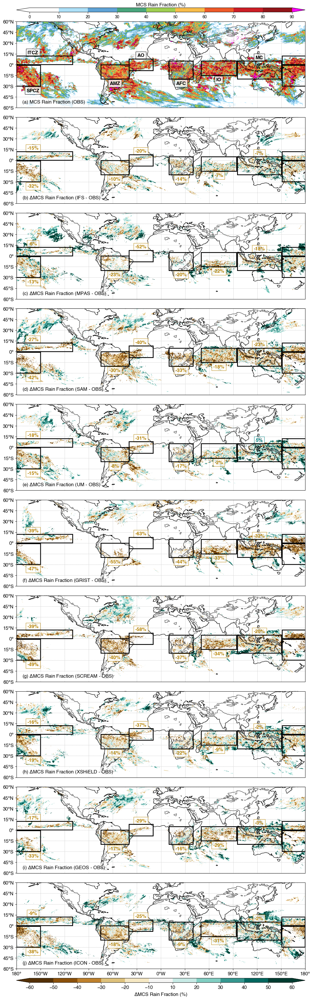

In [64]:
figwidth = 12
height_ratio_per_panel = 0.35 
ratio = height_ratio_per_panel * ds.dims['source']
figsize = [figwidth,figwidth*ratio]
fontsize = 12
cb_fontsize = 10
varname1 = 'MCS Rain Fraction'
varname2 = '$\Delta$MCS Rain Fraction'
units = '%'

# Combine OBS & model differences
min_mcspcp_thresh = 1.0  # [mm/day]
data_dict = xr.concat([mcspcpfrac_obs, mcspcpfrac_diff.where(mcspcp_mod > min_mcspcp_thresh)], dim='source')
lev1 = np.arange(0, 90.01, 10)
lev2 = np.arange(-60, 60.1, 10)
lev2 = np.delete(lev2, int((len(lev2)-1)/2))
cmap1 = generate_NCL_cmap('WhiteBlueGreenYellowRed')
cmap2 = 'BrBG'

nrows = len(name_map)
nmodel = nrows-1
titles = []
for ii in range(len(name_map)):
    key = list(name_map.keys())[ii]
    label = '('+chr(ord('a') + ii)+')'
    if key == 'obs': 
        titles.append(f'{label} {varname1} ({name_map[key]})')
    else:
        titles.append(f'{label} {varname2} ({name_map[key]} - OBS)')

levels = [lev1] + [lev2]*nmodel
cbticks = levels
cmaps = [cmap1] + [cmap2]*nmodel
oob_colors = [{'under':'white', 'over':'magenta'}] + [None]*nmodel
cblabels = [f'{varname1} ({units})', f'{varname2} ({units})']
text_colors = {'pos':'teal', 'neg':'darkgoldenrod'}

figname = f'{figdir}globalmap_mcs_rainfrac_obs_diff_all.png'
fig = plot_maps_nrow(nrows, data_dict, lon_obs, lat_obs, titles, levels, cmaps, cblabels, cbticks, figname, 
                     figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, 
                     boxes=boxes, boxtextloc=text_loc, dict_text_type=dict_text_type, dict_text_val=dict_text_val, text_colors=text_colors)

In [ ]:
# lev1 = np.arange(0, 90.01, 10)
# cmap = generate_NCL_cmap('WhiteBlueGreenYellowRed')
# norm = colors.BoundaryNorm(boundaries=lev1, ncolors=cmap.N)
# cf1 = plt.pcolormesh(mcspcpfrac_obs, norm=norm, cmap=cmap)
# plt.colorbar()
# oob_colors = {'under':'white', 'over':'magenta'}
# cf1.cmap.set_over(oob_colors['over'])
# cf1.cmap.set_under(oob_colors['under'])
# cf1.set_clim(min(lev1), max(lev1))